In [223]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split, cross_validate, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, make_scorer, roc_curve, auc, precision_recall_curve, recall_score, f1_score, confusion_matrix, classification_report, make_scorer
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns


In [224]:
pip install --upgrade scikit-learn


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [225]:
# Load the Excel file from a specified path
file_path = '/Users/warishasaad/Downloads/FORM 2.xlsx'

In [226]:
df = pd.read_excel(file_path)

In [227]:
# Display initial information about the DataFrame
print("Initial DataFrame info:")
print(df.info())
print("\nInitial DataFrame head:")
print(df.head())

Initial DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5107 entries, 0 to 5106
Columns: 135 entries, Unnamed: 0 to WEIGHT_W99
dtypes: datetime64[ns](2), float64(2), int64(2), object(129)
memory usage: 5.3+ MB
None

Initial DataFrame head:
   Unnamed: 0    QKEY INTERVIEW_START_W99   INTERVIEW_END_W99 DEVICE_TYPE_W99  \
0           0  100260 2021-11-03 14:25:27 2021-11-03 14:45:34       Laptop/PC   
1           3  100598 2021-11-02 13:01:05 2021-11-04 12:37:42       Laptop/PC   
2           4  100637 2021-11-02 12:32:58 2021-11-02 12:46:23       Laptop/PC   
3           7  101437 2021-11-04 11:44:54 2021-11-04 12:09:16       Laptop/PC   
4           9  101493 2021-11-02 12:19:47 2021-11-02 13:42:56       Laptop/PC   

  LANG_W99 FORM_W99    XTABLET_W99                              SC1_W99  \
0  English   Form 2  Non-tablet HH                      Mostly positive   
1  English   Form 2  Non-tablet HH                      Mostly positive   
2  English   Form 2  Non-table

In [228]:
print("Missing Values :", df.isnull().sum(), sep="\n")

Missing Values :
Unnamed: 0              0
QKEY                    0
INTERVIEW_START_W99     0
INTERVIEW_END_W99       0
DEVICE_TYPE_W99         0
                       ..
F_IDEO                  0
F_INTFREQ              77
F_VOLSUM                0
F_INC_TIER2             0
WEIGHT_W99              0
Length: 135, dtype: int64


In [229]:
# Drop columns containing 'GENEV' or 'EXOV'
columns_to_drop = df.filter(regex='GENEV|EXOV').columns
df.drop(columns=columns_to_drop, inplace=True)


#columns_to_drop = ['F_BORN', 'EXCITEOE_W99_OE1', 'CONCERNOE_W99_OE1','SMALG1_W99']  # Replace with the actual column names you want to drop
#df = df.drop(columns=columns_to_drop)

'SMALG1_W99'
columns_to_drop = 'SMALG1_W99'
df = df.drop(columns=columns_to_drop)

In [230]:
# Display information after dropping columns
print("\nDataFrame info after dropping columns:")
print(df.info())



DataFrame info after dropping columns:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5107 entries, 0 to 5106
Data columns (total 91 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             5107 non-null   int64         
 1   QKEY                   5107 non-null   int64         
 2   INTERVIEW_START_W99    5107 non-null   datetime64[ns]
 3   INTERVIEW_END_W99      5107 non-null   datetime64[ns]
 4   DEVICE_TYPE_W99        5107 non-null   object        
 5   LANG_W99               5107 non-null   object        
 6   FORM_W99               5107 non-null   object        
 7   XTABLET_W99            5107 non-null   object        
 8   SC1_W99                5107 non-null   object        
 9   CNCEXC_W99             5107 non-null   object        
 10  EXCITEOE_W99_OE1       964 non-null    object        
 11  EXCITEOE_REFUSED_W99   5107 non-null   object        
 12  CONCERNOE_W99_OE1     

In [231]:
print("\nDataFrame head after dropping columns:")
print(df.head())


DataFrame head after dropping columns:
   Unnamed: 0    QKEY INTERVIEW_START_W99   INTERVIEW_END_W99 DEVICE_TYPE_W99  \
0           0  100260 2021-11-03 14:25:27 2021-11-03 14:45:34       Laptop/PC   
1           3  100598 2021-11-02 13:01:05 2021-11-04 12:37:42       Laptop/PC   
2           4  100637 2021-11-02 12:32:58 2021-11-02 12:46:23       Laptop/PC   
3           7  101437 2021-11-04 11:44:54 2021-11-04 12:09:16       Laptop/PC   
4           9  101493 2021-11-02 12:19:47 2021-11-02 13:42:56       Laptop/PC   

  LANG_W99 FORM_W99    XTABLET_W99                              SC1_W99  \
0  English   Form 2  Non-tablet HH                      Mostly positive   
1  English   Form 2  Non-tablet HH                      Mostly positive   
2  English   Form 2  Non-tablet HH  Equal positive and negative effects   
3  English   Form 2  Non-tablet HH                      Mostly negative   
4  English   Form 2  Non-tablet HH                      Mostly negative   

                      

In [232]:
home_directory = os.path.expanduser('~')
output_path = os.path.join(home_directory, 'NEWFORM.xlsx')
df.to_excel(output_path, index=False)
print(f"File saved to {os.path.join(home_directory, 'NEWFORM.xlsx')}")

File saved to /Users/warishasaad/NEWFORM.xlsx


In [233]:
# Load the dataset
file_path = '/Users/warishasaad/NEWFORM.xlsx'
data = pd.read_excel(file_path)

In [234]:
# Identify columns related to 'BCHIP'
bchip_columns = [col for col in df.columns if 'BCHIP' in col]

In [235]:
# Handle missing values in BCHIP columns using the most frequent strategy
imputer = SimpleImputer(strategy='most_frequent')
df[bchip_columns] = imputer.fit_transform(df[bchip_columns])


In [236]:

# Ensure BCHIP columns contain only string values
df[bchip_columns] = df[bchip_columns].astype(str)

In [237]:
# Create new features based on BCHIP columns
# Example: Count the number of positive responses in certain BCHIP columns
positive_responses = ['A lot', 'Very much', 'Strongly agree']
df['BCHIP_positive_count'] = df[bchip_columns].apply(lambda x: x.isin(positive_responses).sum(), axis=1)


In [238]:
# Example: Create a binary feature indicating if any BCHIP column has a negative response
negative_responses = ['Nothing at all', 'Not at all', 'Strongly disagree']
df['BCHIP_any_negative'] = df[bchip_columns].apply(lambda x: x.isin(negative_responses).any(), axis=1).astype(int)


In [239]:
# Example: Aggregate responses into a sentiment score
response_mapping = {'A lot': 3, 'Very much': 3, 'Strongly agree': 3,
                    'A little': 2, 'Somewhat': 2, 'Agree': 2,
                    'Nothing at all': 1, 'Not at all': 1, 'Strongly disagree': 1}

# Apply the mapping and convert to numeric
df_mapped = df[bchip_columns].replace(response_mapping)
df_mapped = df_mapped.apply(pd.to_numeric, errors='coerce')

# Calculate the sentiment score
df['BCHIP_sentiment_score'] = df_mapped.sum(axis=1)

In [240]:
# Display the final DataFrame with new features
print("\nFinal DataFrame with new features:")
print(df[['BCHIP_positive_count', 'BCHIP_any_negative', 'BCHIP_sentiment_score']].head())



Final DataFrame with new features:
   BCHIP_positive_count  BCHIP_any_negative  BCHIP_sentiment_score
0                     0                   1                    1.0
1                     0                   1                    1.0
2                     0                   1                    1.0
3                     0                   0                    2.0
4                     0                   0                    2.0


Text(0, 0.5, 'Frequency')

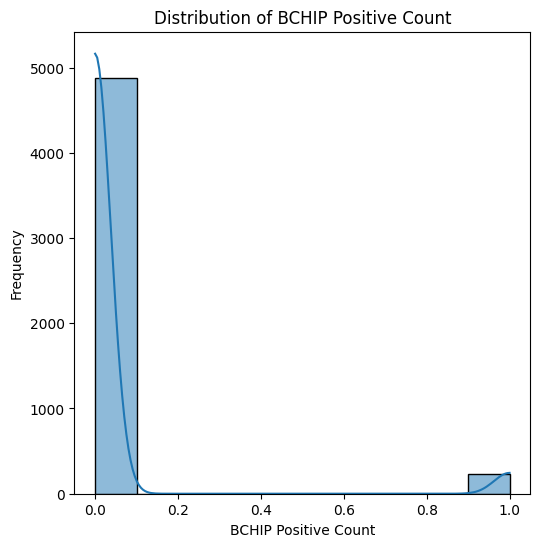

In [241]:

# Plotting the new features
plt.figure(figsize=(20, 6))

# Histogram of BCHIP_positive_count
plt.subplot(1, 3, 1)
sns.histplot(df['BCHIP_positive_count'], bins=10, kde=True)
plt.title('Distribution of BCHIP Positive Count')
plt.xlabel('BCHIP Positive Count')
plt.ylabel('Frequency')




Text(0, 0.5, 'Count')

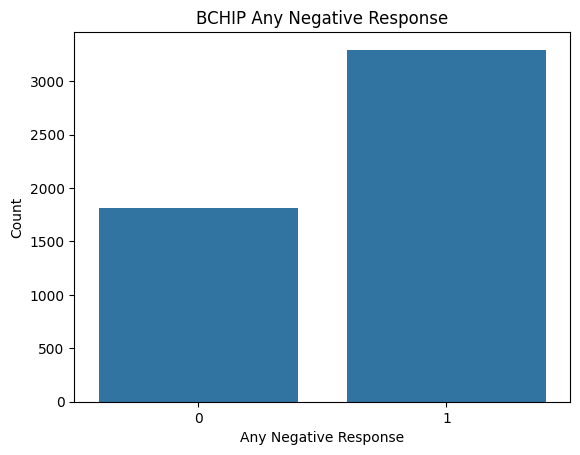

In [242]:

# Bar plot of BCHIP_any_negative
plt.subplot(1, 1, 1)
sns.countplot(x='BCHIP_any_negative', data=df)
plt.title('BCHIP Any Negative Response')
plt.xlabel('Any Negative Response')
plt.ylabel('Count')



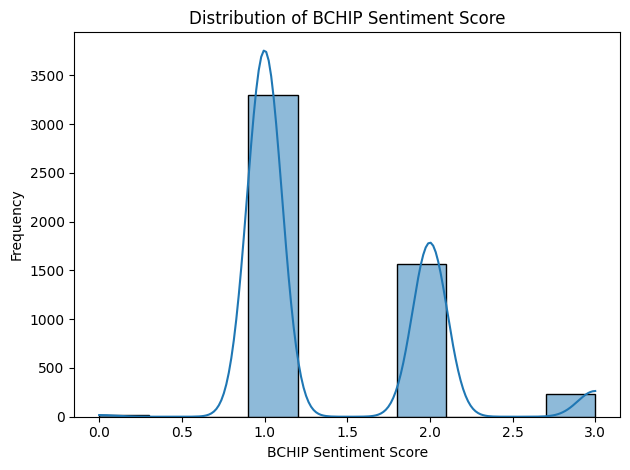

In [243]:
# Histogram of BCHIP_sentiment_score
plt.subplot(1, 1, 1)
sns.histplot(df['BCHIP_sentiment_score'], bins=10, kde=True)
plt.title('Distribution of BCHIP Sentiment Score')
plt.xlabel('BCHIP Sentiment Score')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


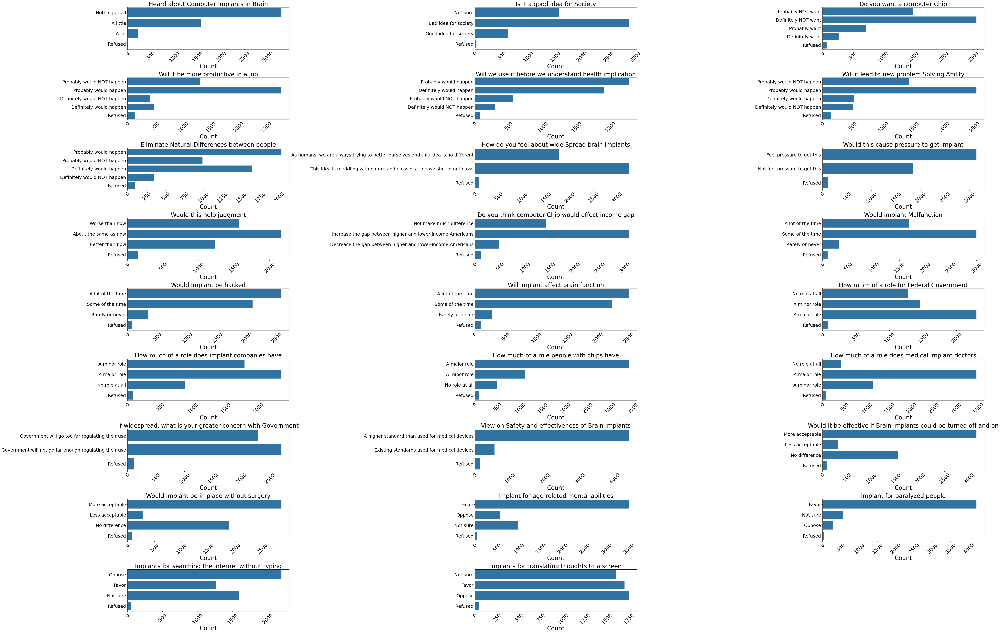

In [244]:

# Add a description to the column names in bchip_data using a dictionary
column_description = {
    'BCHIP1_W99': 'Heard about Computer Implants in Brain',
    'BCHIP2_W99': 'Is it a good idea for Society',
    'BCHIP3_W99': 'Do you want a computer Chip',
    'BCHIP4_a_W99': 'Will it be more productive in a job',
    'BCHIP4_b_W99': 'Will we use it before we understand health implication',
    'BCHIP4_c_W99': 'Will it lead to new problem Solving Ability',
    'BCHIP4_d_W99': 'Eliminate Natural Differences between people',
    'BCHIP5_W99': 'How do you feel about wide Spread brain implants',
    'BCHIP6_W99': 'Would this cause pressure to get implant',
    'BCHIP7_W99': 'Would this help judgment',
    'BCHIP8_W99': 'Do you think computer Chip would effect income gap',
    'BCHIP9_a_W99': 'Would implant Malfunction',
    'BCHIP9_b_W99': 'Would Implant be hacked',
    'BCHIP9_c_W99': 'Will implant affect brain function',
    'BCHIP10_a_W99': 'How much of a role for Federal Government',
    'BCHIP10_b_W99': 'How much of a role does implant companies have',
    'BCHIP10_c_W99': 'How much of a role people with chips have',
    'BCHIP10_d_W99': 'How much of a role does medical implant doctors',
    'BCHIP11_W99': 'If widespread, what is your greater concern with Government',
    'BCHIP12_W99': 'View on Safety and effectiveness of Brain Implants',
    'BCHIP13_a_W99': 'Would it be effective if Brain Implants could be turned off and on',
    'BCHIP13_b_W99': 'Would implant be in place without surgery',
    'BCHIP14_a_W99': 'Implant for age-related mental abilities',
    'BCHIP14_b_W99': 'Implant for paralyzed people',
    'BCHIP14_c_W99': 'Implants for searching the internet without typing',
    'BCHIP14_d_W99': 'Implants for translating thoughts to a screen'
}

# Calculate the number of rows and columns needed for the subplots
n_bchip_cols = len(bchip_columns)
ncols = 3
nrows = (n_bchip_cols + ncols - 1) // ncols  # Ceiling division

# Additional detailed count plot for individual BCHIP columns
plt.figure(figsize=(70, nrows * 5))
for i, col in enumerate(bchip_columns):
    plt.subplot(nrows, ncols, i+1)
    sns.countplot(y=col, data=df)
    plt.title(column_description.get(col, col), fontsize=30)
    plt.xlabel('Count', fontsize=30)
    plt.ylabel('')
    plt.tick_params(axis='x', rotation=45, labelsize=25)
    plt.tick_params(axis='y', labelsize=23)
plt.tight_layout()
plt.show()

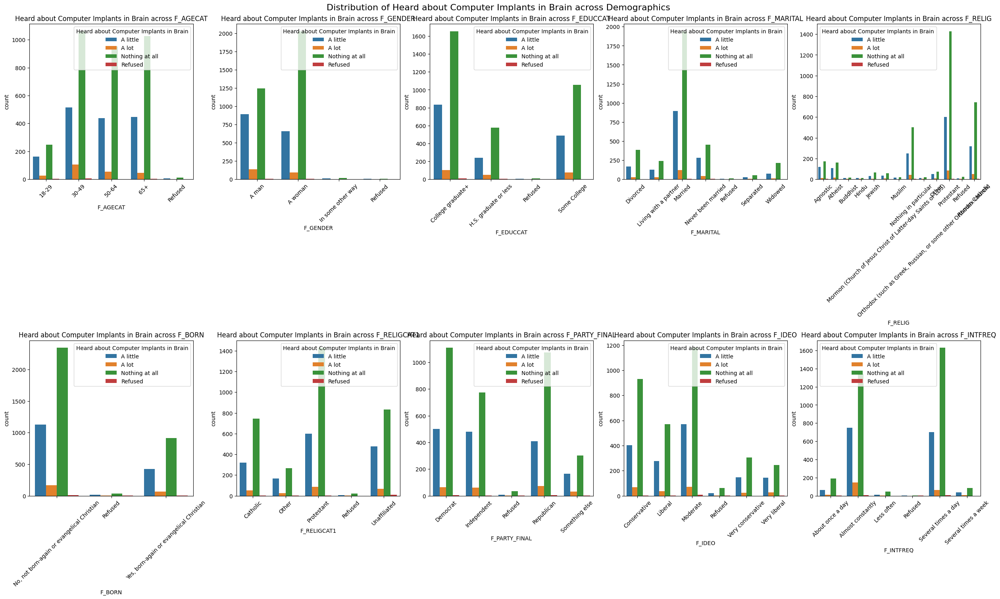


Crosstab between F_AGECAT and Heard about Computer Implants in Brain:

BCHIP1_W99  A little  A lot  Nothing at all  Refused
F_AGECAT                                            
18-29            163     26             246        3
30-49            514    104            1061        7
50-64            437     55             951        1
65+              446     45            1026        4
Refused            6      1              11        0

Crosstab between F_GENDER and Heard about Computer Implants in Brain:

BCHIP1_W99         A little  A lot  Nothing at all  Refused
F_GENDER                                                   
A man                   892    137            1244        6
A woman                 659     93            2028        8
In some other way        12      1              15        1
Refused                   3      0               8        0

Crosstab between F_EDUCCAT and Heard about Computer Implants in Brain:

BCHIP1_W99             A little  A lot  Nothing at a

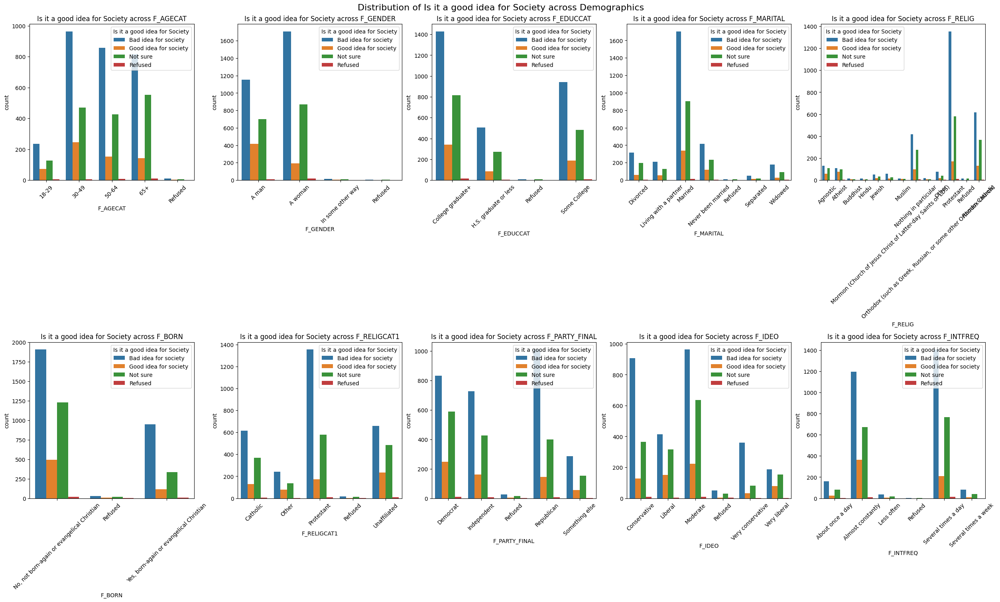


Crosstab between F_AGECAT and Is it a good idea for Society:

BCHIP2_W99  Bad idea for society  Good idea for society  Not sure  Refused
F_AGECAT                                                                  
18-29                        234                     72       127        5
30-49                        964                    245       471        6
50-64                        858                    153       425        8
65+                          816                    142       553       10
Refused                       11                      3         4        0

Crosstab between F_GENDER and Is it a good idea for Society:

BCHIP2_W99         Bad idea for society  Good idea for society  Not sure  \
F_GENDER                                                                   
A man                              1155                    417       698   
A woman                            1708                    192       868   
In some other way                    14      

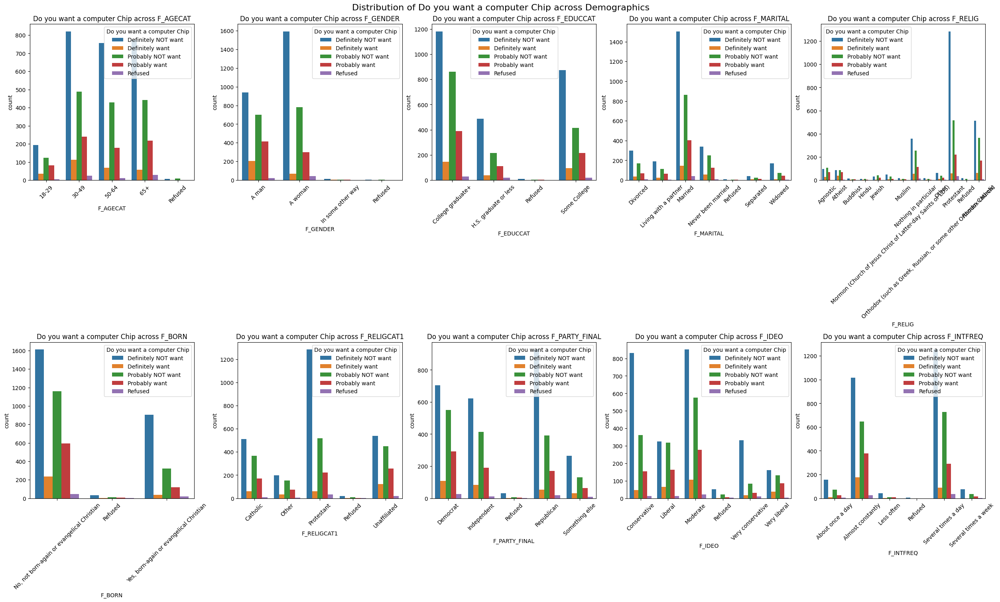


Crosstab between F_AGECAT and Do you want a computer Chip:

BCHIP3_W99  Definitely NOT want  Definitely want  Probably NOT want  \
F_AGECAT                                                              
18-29                       193               36                124   
30-49                       821              112                489   
50-64                       757               69                429   
65+                         774               58                442   
Refused                       7                1                  9   

BCHIP3_W99  Probably want  Refused  
F_AGECAT                            
18-29                  81        4  
30-49                 240       24  
50-64                 179       10  
65+                   218       29  
Refused                 1        0  

Crosstab between F_GENDER and Do you want a computer Chip:

BCHIP3_W99         Definitely NOT want  Definitely want  Probably NOT want  \
F_GENDER                                   

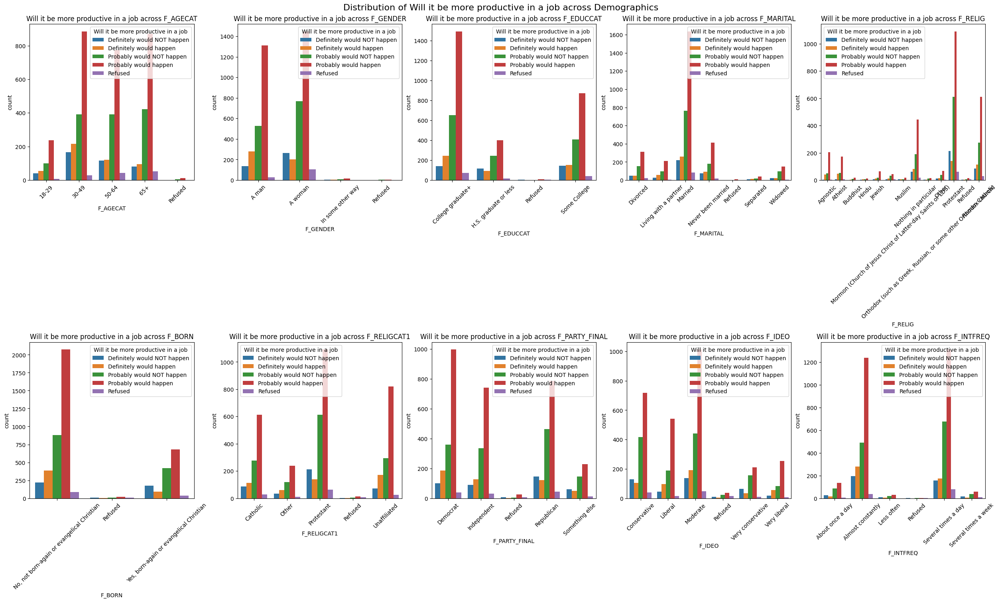


Crosstab between F_AGECAT and Will it be more productive in a job:

BCHIP4_a_W99  Definitely would NOT happen  Definitely would happen  \
F_AGECAT                                                             
18-29                                  40                       54   
30-49                                 166                      215   
50-64                                 117                      120   
65+                                    81                       95   
Refused                                 1                        1   

BCHIP4_a_W99  Probably would NOT happen  Probably would happen  Refused  
F_AGECAT                                                                 
18-29                                99                    237        8  
30-49                               391                    885       29  
50-64                               392                    772       43  
65+                                 421                    871       5

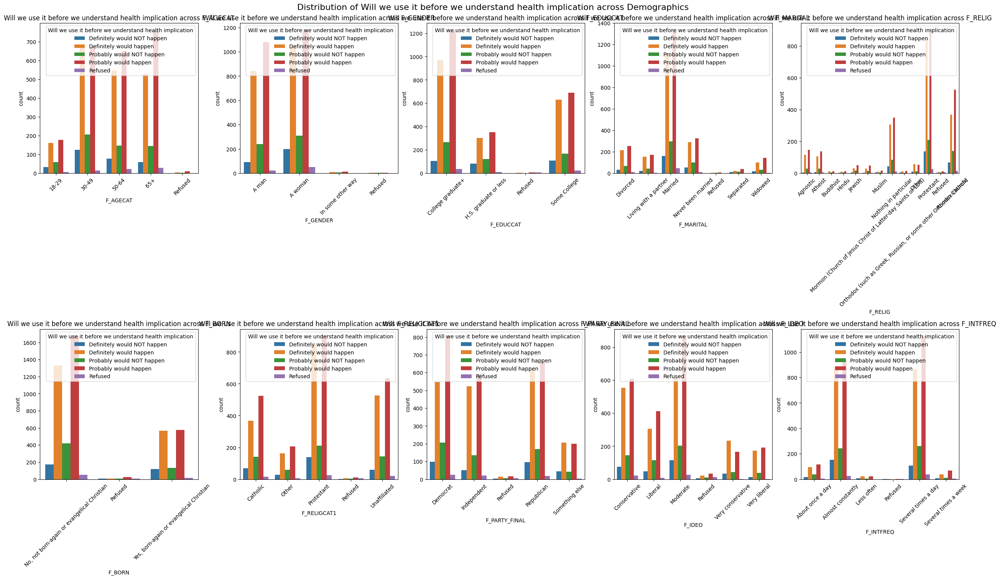


Crosstab between F_AGECAT and Will we use it before we understand health implication:

BCHIP4_b_W99  Definitely would NOT happen  Definitely would happen  \
F_AGECAT                                                             
18-29                                  32                      162   
30-49                                 124                      666   
50-64                                  78                      546   
65+                                    59                      527   
Refused                                 1                        5   

BCHIP4_b_W99  Probably would NOT happen  Probably would happen  Refused  
F_AGECAT                                                                 
18-29                                59                    178        7  
30-49                               206                    675       15  
50-64                               146                    651       23  
65+                                 145            

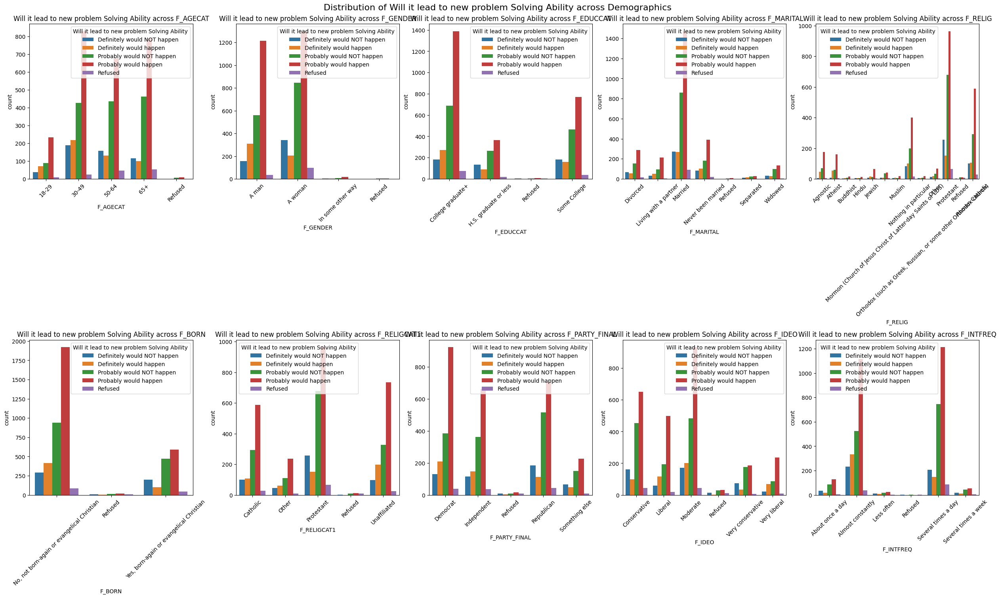


Crosstab between F_AGECAT and Will it lead to new problem Solving Ability:

BCHIP4_c_W99  Definitely would NOT happen  Definitely would happen  \
F_AGECAT                                                             
18-29                                  37                       71   
30-49                                 189                      217   
50-64                                 158                      130   
65+                                   116                      101   
Refused                                 1                        1   

BCHIP4_c_W99  Probably would NOT happen  Probably would happen  Refused  
F_AGECAT                                                                 
18-29                                88                    233        9  
30-49                               427                    829       24  
50-64                               435                    675       46  
65+                                 462                    788

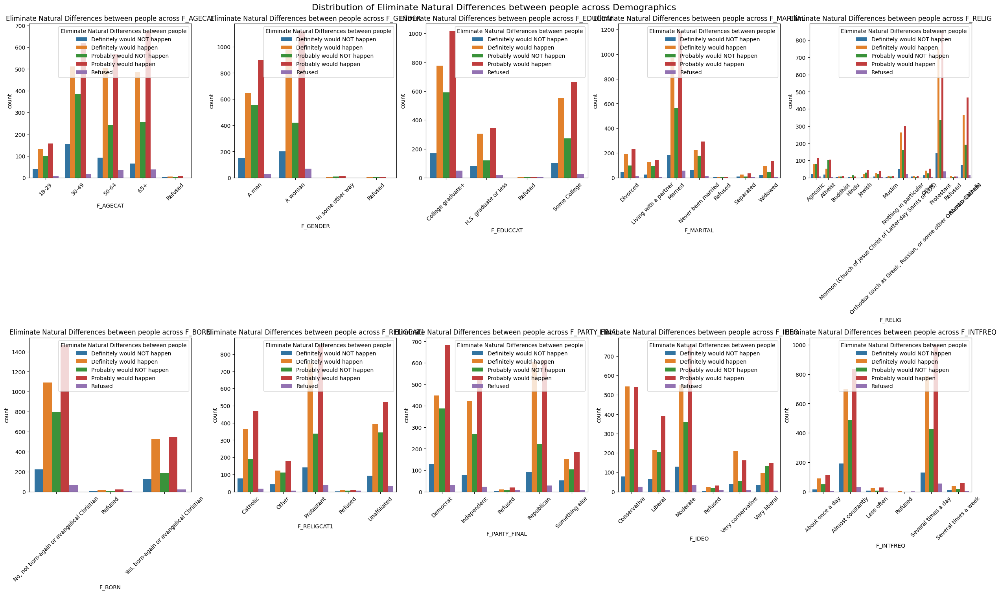


Crosstab between F_AGECAT and Eliminate Natural Differences between people:

BCHIP4_d_W99  Definitely would NOT happen  Definitely would happen  \
F_AGECAT                                                             
18-29                                  40                      132   
30-49                                 153                      511   
50-64                                  93                      504   
65+                                    65                      486   
Refused                                 1                        5   

BCHIP4_d_W99  Probably would NOT happen  Probably would happen  Refused  
F_AGECAT                                                                 
18-29                               100                    158        8  
30-49                               385                    621       16  
50-64                               243                    569       35  
65+                                 257                    67

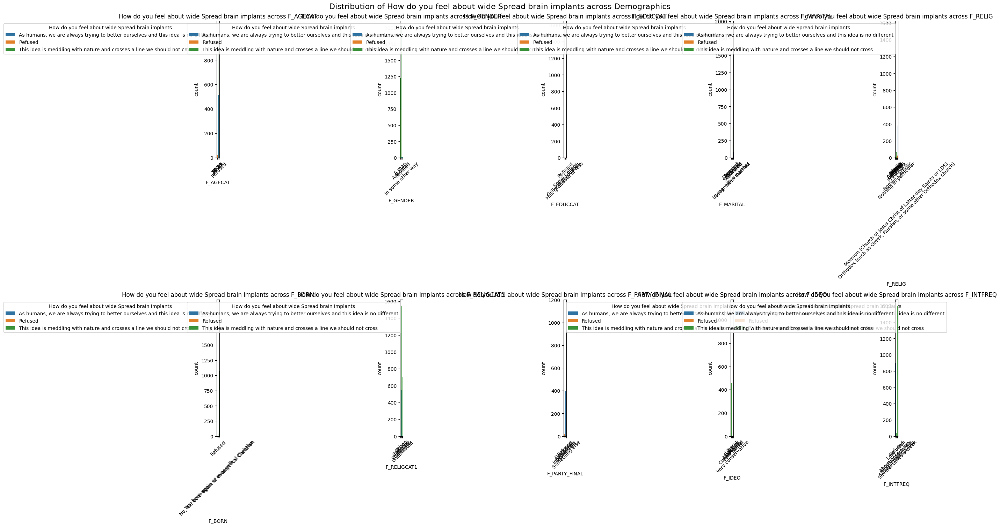


Crosstab between F_AGECAT and How do you feel about wide Spread brain implants:

BCHIP5_W99  As humans, we are always trying to better ourselves and this idea is no different  \
F_AGECAT                                                                                        
18-29                                                     192                                   
30-49                                                     599                                   
50-64                                                     465                                   
65+                                                       515                                   
Refused                                                     8                                   

BCHIP5_W99  Refused  \
F_AGECAT              
18-29             9   
30-49            19   
50-64            21   
65+              27   
Refused           0   

BCHIP5_W99  This idea is meddling with nature and crosses a line we should n

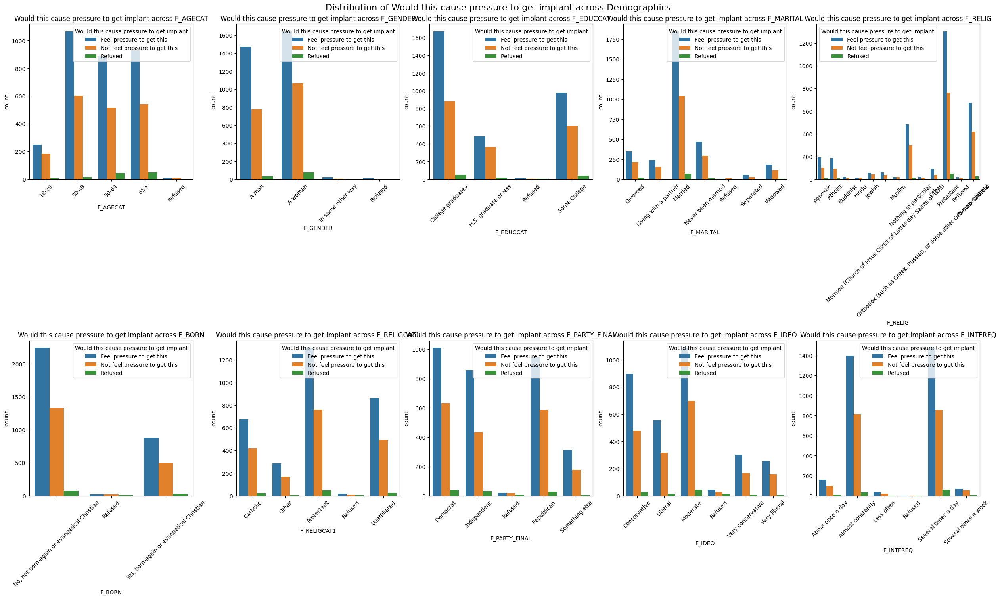


Crosstab between F_AGECAT and Would this cause pressure to get implant:

BCHIP6_W99  Feel pressure to get this  Not feel pressure to get this  Refused
F_AGECAT                                                                     
18-29                             250                            182        6
30-49                            1068                            604       14
50-64                             888                            514       42
65+                               930                            542       49
Refused                            10                              8        0

Crosstab between F_GENDER and Would this cause pressure to get implant:

BCHIP6_W99         Feel pressure to get this  Not feel pressure to get this  \
F_GENDER                                                                      
A man                                   1470                            777   
A woman                                 1644                         

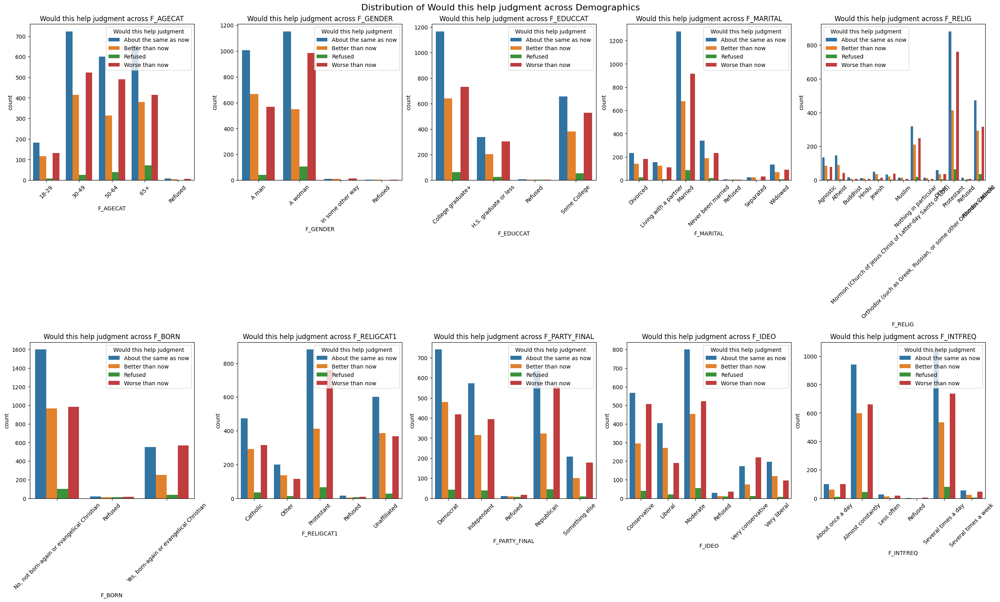


Crosstab between F_AGECAT and Would this help judgment:

BCHIP7_W99  About the same as now  Better than now  Refused  Worse than now
F_AGECAT                                                                   
18-29                         183              116        7             132
30-49                         723              414       26             523
50-64                         601              314       39             490
65+                           654              380       72             415
Refused                         8                4        0               6

Crosstab between F_GENDER and Would this help judgment:

BCHIP7_W99         About the same as now  Better than now  Refused  \
F_GENDER                                                             
A man                               1005              667       39   
A woman                             1152              549      104   
In some other way                      9                9        0   
Re

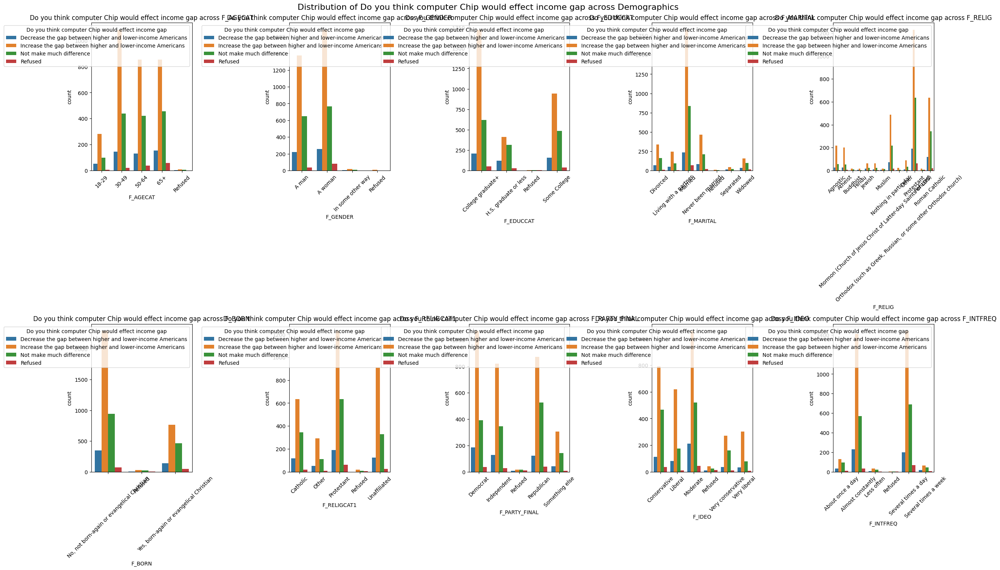


Crosstab between F_AGECAT and Do you think computer Chip would effect income gap:

BCHIP8_W99  Decrease the gap between higher and lower-income Americans  \
F_AGECAT                                                                 
18-29                                                      51            
30-49                                                     145            
50-64                                                     131            
65+                                                       153            
Refused                                                     4            

BCHIP8_W99  Increase the gap between higher and lower-income Americans  \
F_AGECAT                                                                 
18-29                                                     283            
30-49                                                    1084            
50-64                                                     854            
65+                        

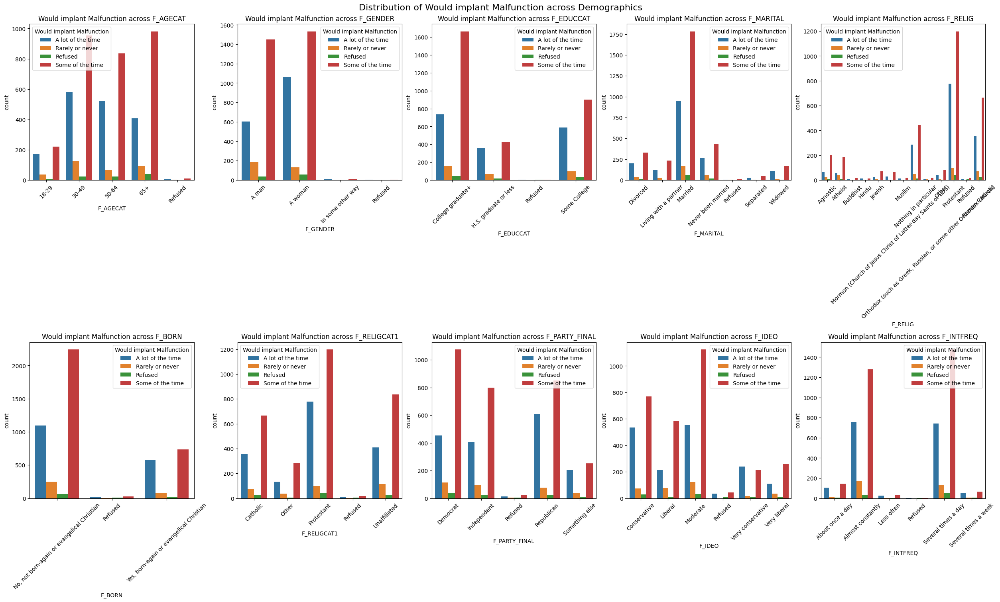


Crosstab between F_AGECAT and Would implant Malfunction:

BCHIP9_a_W99  A lot of the time  Rarely or never  Refused  Some of the time
F_AGECAT                                                                   
18-29                       172               37        8               221
30-49                       582              127       24               953
50-64                       520               65       24               835
65+                         406               92       42               981
Refused                       5                2        0                11

Crosstab between F_GENDER and Would implant Malfunction:

BCHIP9_a_W99       A lot of the time  Rarely or never  Refused  \
F_GENDER                                                         
A man                            605              188       36   
A woman                         1063              133       59   
In some other way                 12                2        2   
Refused             

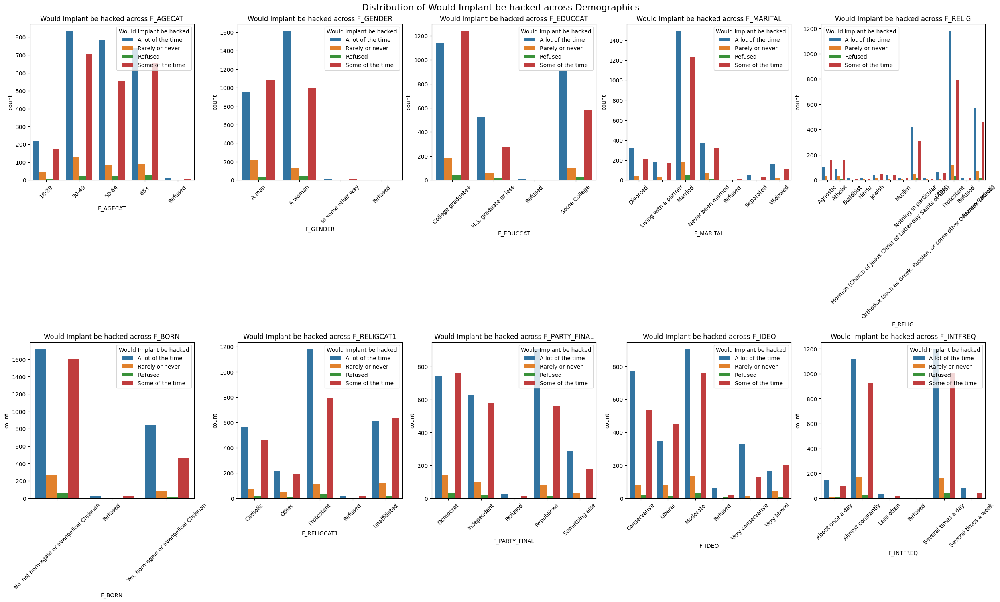


Crosstab between F_AGECAT and Would Implant be hacked:

BCHIP9_b_W99  A lot of the time  Rarely or never  Refused  Some of the time
F_AGECAT                                                                   
18-29                       216               44        6               172
30-49                       832              126       22               706
50-64                       783               87       20               554
65+                         740               92       31               658
Refused                      11                1        0                 6

Crosstab between F_GENDER and Would Implant be hacked:

BCHIP9_b_W99       A lot of the time  Rarely or never  Refused  \
F_GENDER                                                         
A man                            953              215       29   
A woman                         1609              132       47   
In some other way                 15                3        2   
Refused                 

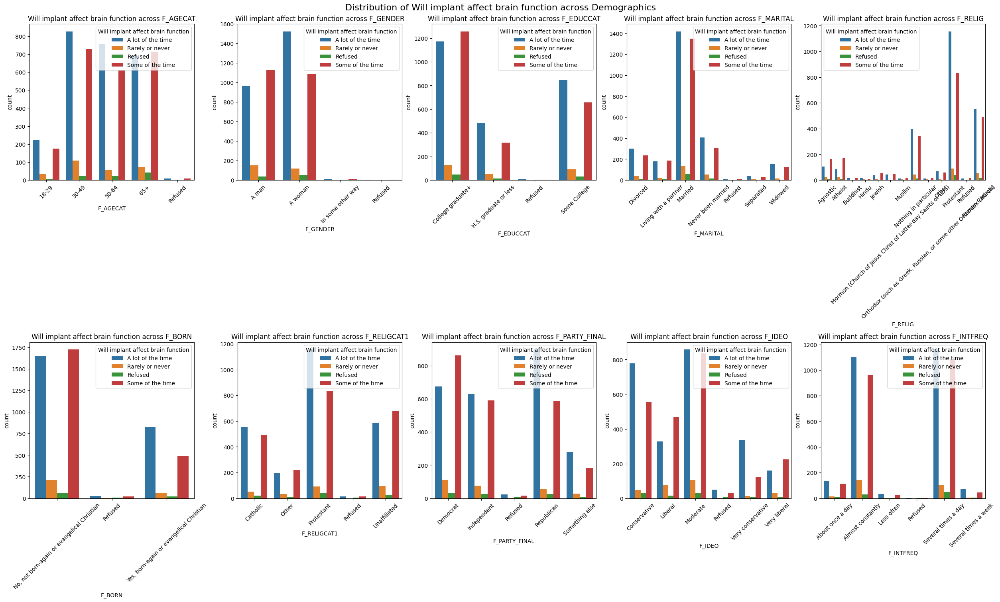


Crosstab between F_AGECAT and Will implant affect brain function:

BCHIP9_c_W99  A lot of the time  Rarely or never  Refused  Some of the time
F_AGECAT                                                                   
18-29                       223               34        7               174
30-49                       827              108       22               729
50-64                       756               57       22               609
65+                         692               73       42               714
Refused                       9                1        0                 8

Crosstab between F_GENDER and Will implant affect brain function:

BCHIP9_c_W99       A lot of the time  Rarely or never  Refused  \
F_GENDER                                                         
A man                            964              151       37   
A woman                         1525              120       53   
In some other way                 13                2        2   
Re

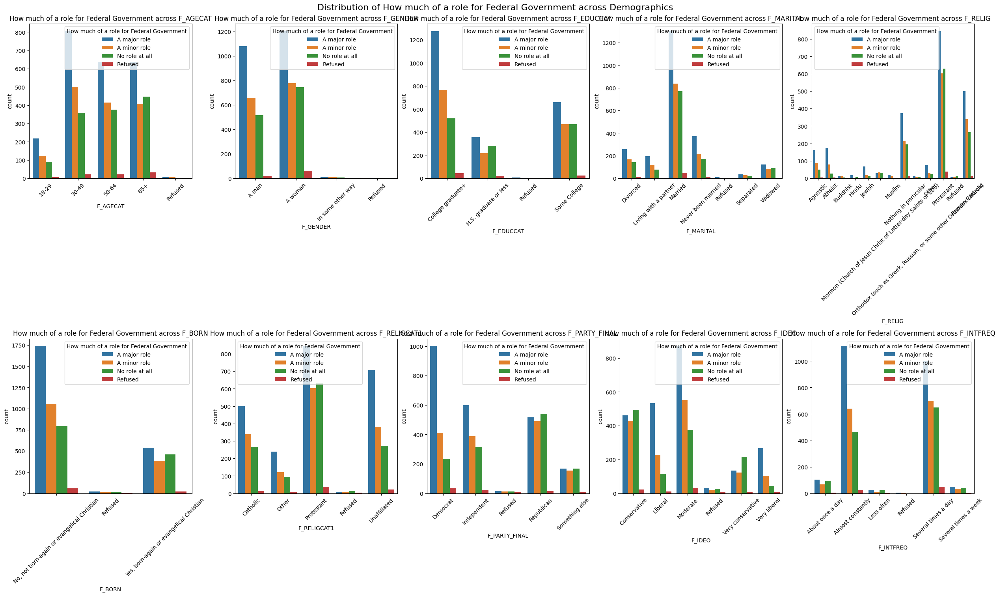


Crosstab between F_AGECAT and How much of a role for Federal Government:

BCHIP10_a_W99  A major role  A minor role  No role at all  Refused
F_AGECAT                                                          
18-29                   218           123              90        7
30-49                   806           500             358       22
50-64                   634           414             375       21
65+                     634           408             446       33
Refused                   7             8               2        1

Crosstab between F_GENDER and How much of a role for Federal Government:

BCHIP10_a_W99      A major role  A minor role  No role at all  Refused
F_GENDER                                                              
A man                      1081           660             518       20
A woman                    1205           777             745       61
In some other way             9            12               7        1
Refused                   

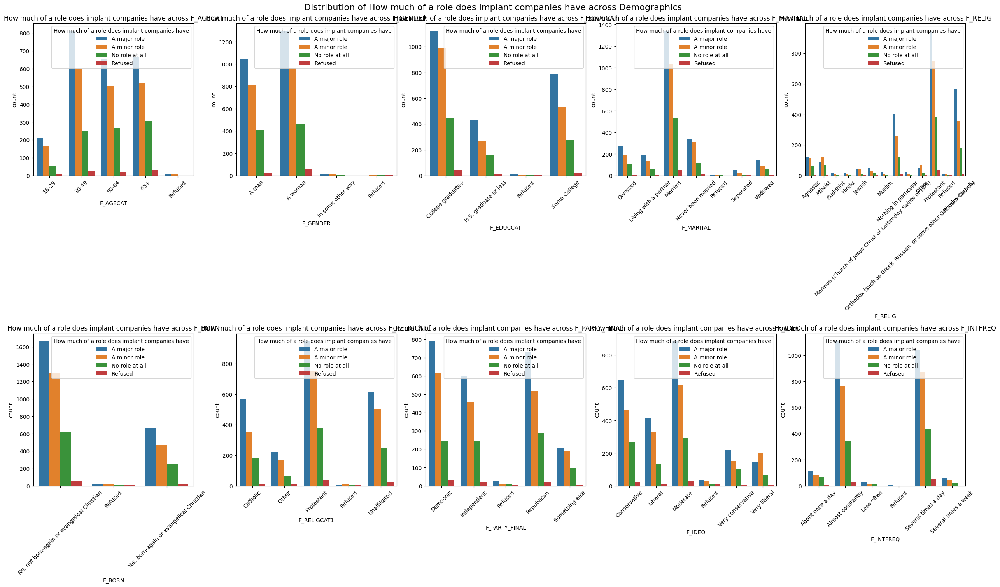


Crosstab between F_AGECAT and How much of a role does implant companies have:

BCHIP10_b_W99  A major role  A minor role  No role at all  Refused
F_AGECAT                                                          
18-29                   213           164              55        6
30-49                   814           597             251       24
50-64                   656           502             267       19
65+                     663           519             306       33
Refused                   9             7               1        1

Crosstab between F_GENDER and How much of a role does implant companies have:

BCHIP10_b_W99      A major role  A minor role  No role at all  Refused
F_GENDER                                                              
A man                      1043           809             406       21
A woman                    1300           963             466       59
In some other way            11            11               6        1
Refused         

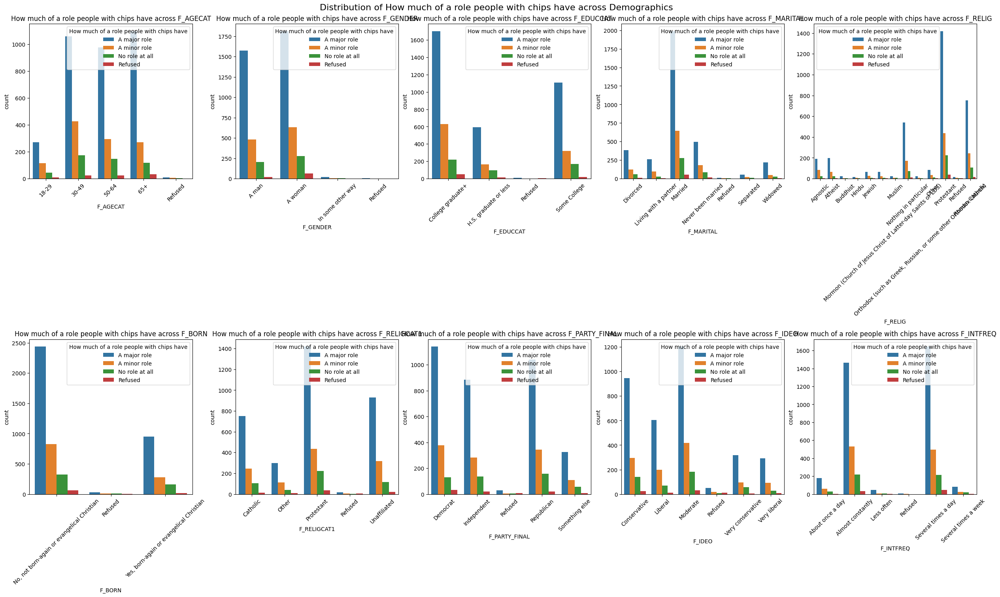


Crosstab between F_AGECAT and How much of a role people with chips have:

BCHIP10_c_W99  A major role  A minor role  No role at all  Refused
F_AGECAT                                                          
18-29                   271           115              44        8
30-49                  1060           428             175       23
50-64                   977           295             148       24
65+                    1099           272             119       31
Refused                   9             6               2        1

Crosstab between F_GENDER and How much of a role people with chips have:

BCHIP10_c_W99      A major role  A minor role  No role at all  Refused
F_GENDER                                                              
A man                      1574           479             206       20
A woman                    1814           632             278       64
In some other way            21             4               3        1
Refused                   

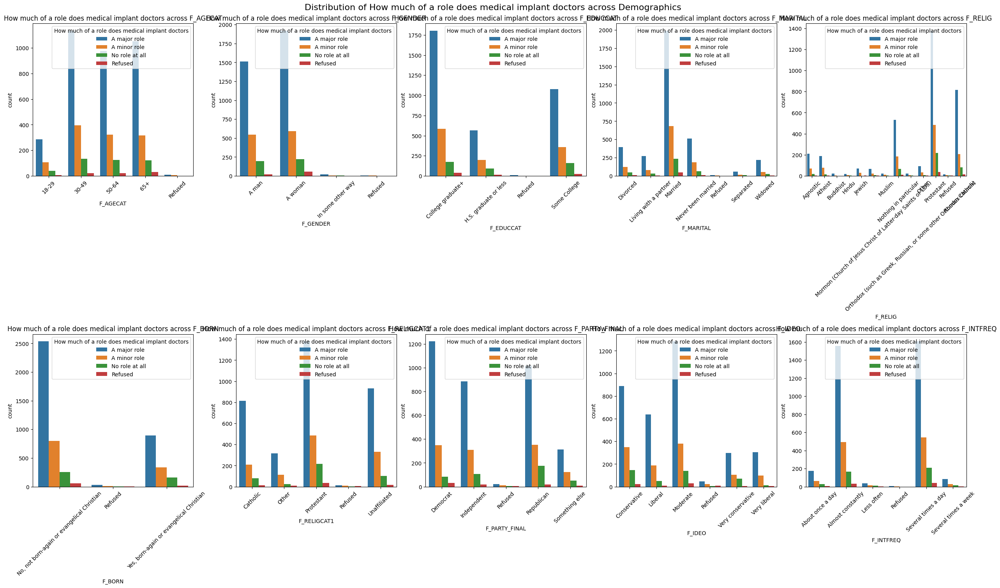


Crosstab between F_AGECAT and How much of a role does medical implant doctors:

BCHIP10_d_W99  A major role  A minor role  No role at all  Refused
F_AGECAT                                                          
18-29                   286           105              40        7
30-49                  1135           395             134       22
50-64                   975           323             126       20
65+                    1053           315             123       30
Refused                  10             7               0        1

Crosstab between F_GENDER and How much of a role does medical implant doctors:

BCHIP10_d_W99      A major role  A minor role  No role at all  Refused
F_GENDER                                                              
A man                      1513           548             197       21
A woman                    1921           590             221       56
In some other way            20             4               4        1
Refused       

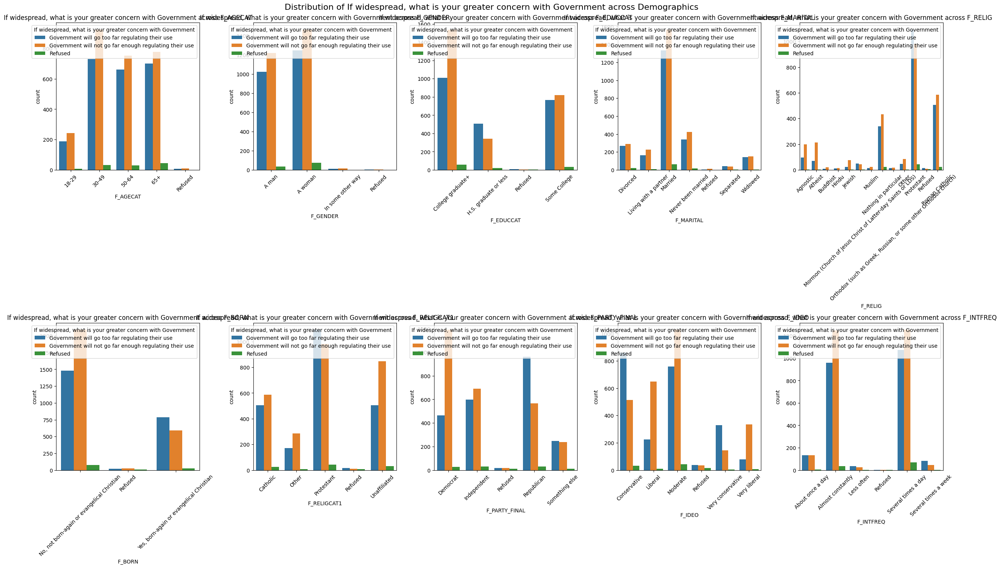


Crosstab between F_AGECAT and If widespread, what is your greater concern with Government:

BCHIP11_W99  Government will go too far regulating their use  \
F_AGECAT                                                       
18-29                                                    189   
30-49                                                    730   
50-64                                                    662   
65+                                                      700   
Refused                                                    8   

BCHIP11_W99  Government will not go far enough regulating their use  Refused  
F_AGECAT                                                                      
18-29                                                      242             7  
30-49                                                      924            32  
50-64                                                      753            29  
65+                                                        777 

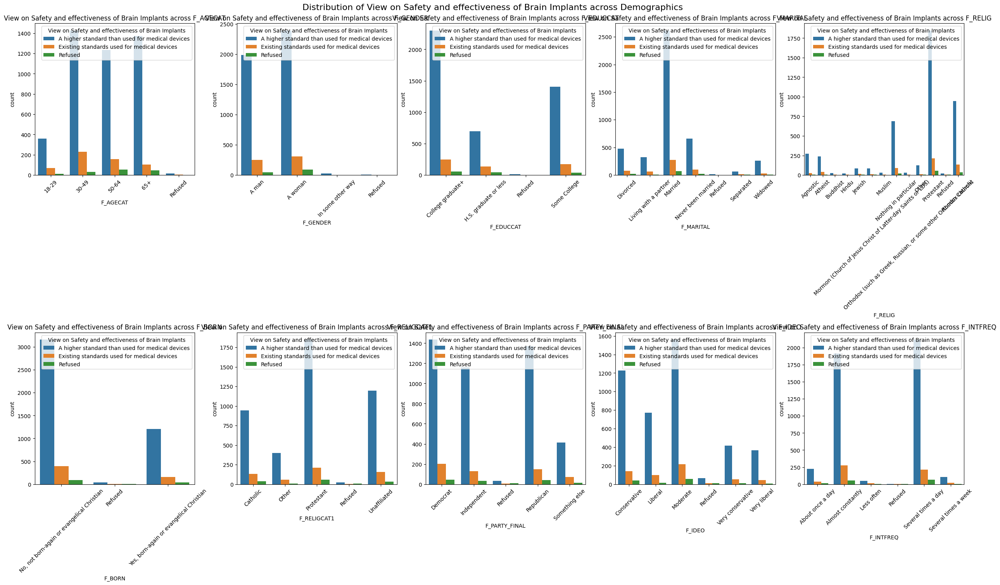


Crosstab between F_AGECAT and View on Safety and effectiveness of Brain Implants:

BCHIP12_W99  A higher standard than used for medical devices  \
F_AGECAT                                                       
18-29                                                    358   
30-49                                                   1427   
50-64                                                   1235   
65+                                                     1374   
Refused                                                   15   

BCHIP12_W99  Existing standards used for medical devices  Refused  
F_AGECAT                                                           
18-29                                                 70       10  
30-49                                                228       31  
50-64                                                157       52  
65+                                                  102       45  
Refused                                                2   

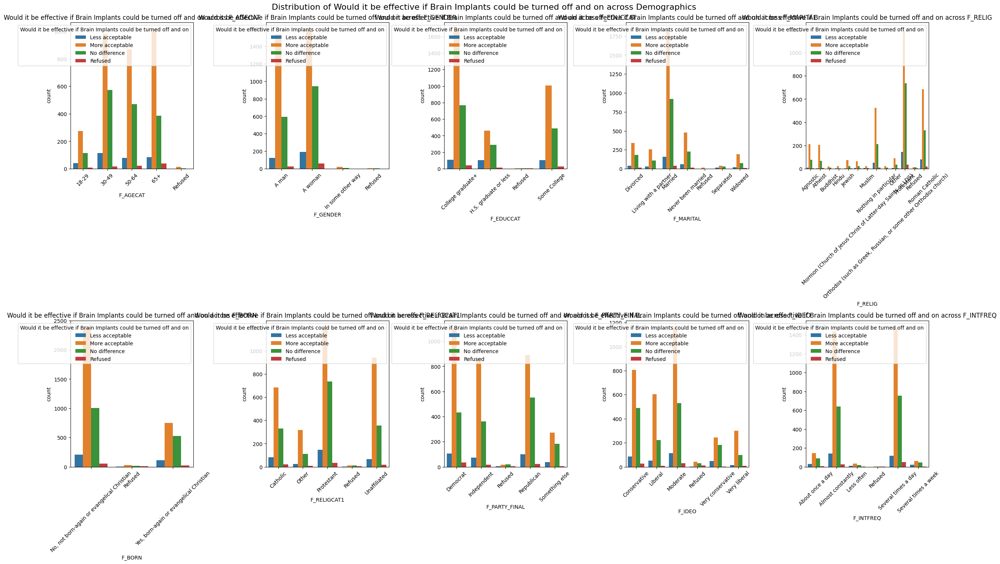


Crosstab between F_AGECAT and Would it be effective if Brain Implants could be turned off and on:

BCHIP13_a_W99  Less acceptable  More acceptable  No difference  Refused
F_AGECAT                                                               
18-29                       40              275            115        8
30-49                      115              982            574       15
50-64                       80              871            470       23
65+                         83             1015            385       38
Refused                      0               14              4        0

Crosstab between F_GENDER and Would it be effective if Brain Implants could be turned off and on:

BCHIP13_a_W99      Less acceptable  More acceptable  No difference  Refused
F_GENDER                                                                   
A man                          123             1538            593       25
A woman                        194             1593            943  

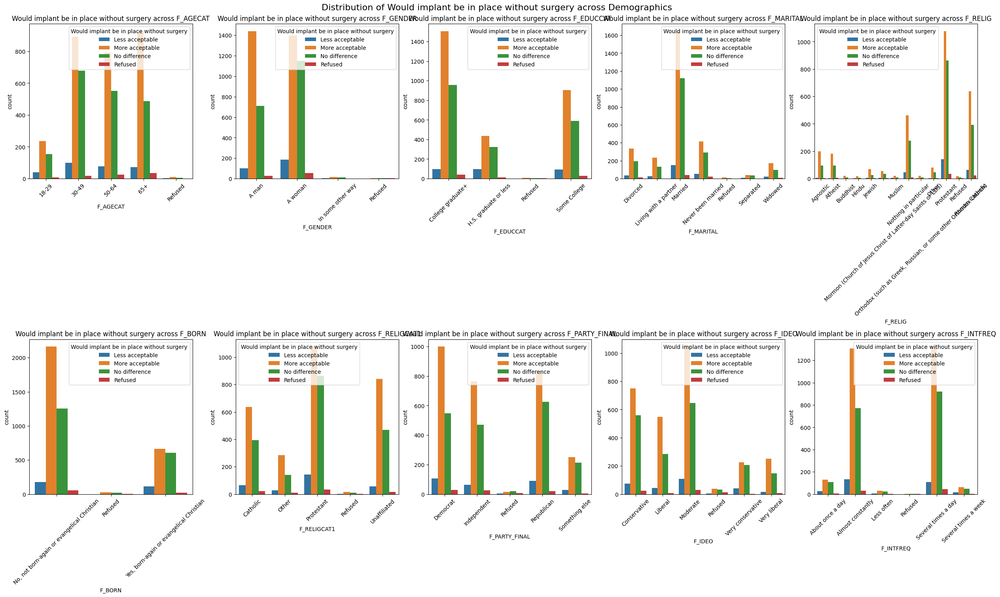


Crosstab between F_AGECAT and Would implant be in place without surgery:

BCHIP13_b_W99  Less acceptable  More acceptable  No difference  Refused
F_AGECAT                                                               
18-29                       39              237            154        8
30-49                      100              891            678       17
50-64                       76              792            551       25
65+                         73              927            486       35
Refused                      2               10              6        0

Crosstab between F_GENDER and Would implant be in place without surgery:

BCHIP13_b_W99      Less acceptable  More acceptable  No difference  Refused
F_GENDER                                                                   
A man                          100             1441            710       28
A woman                        187             1397           1149       55
In some other way                3        

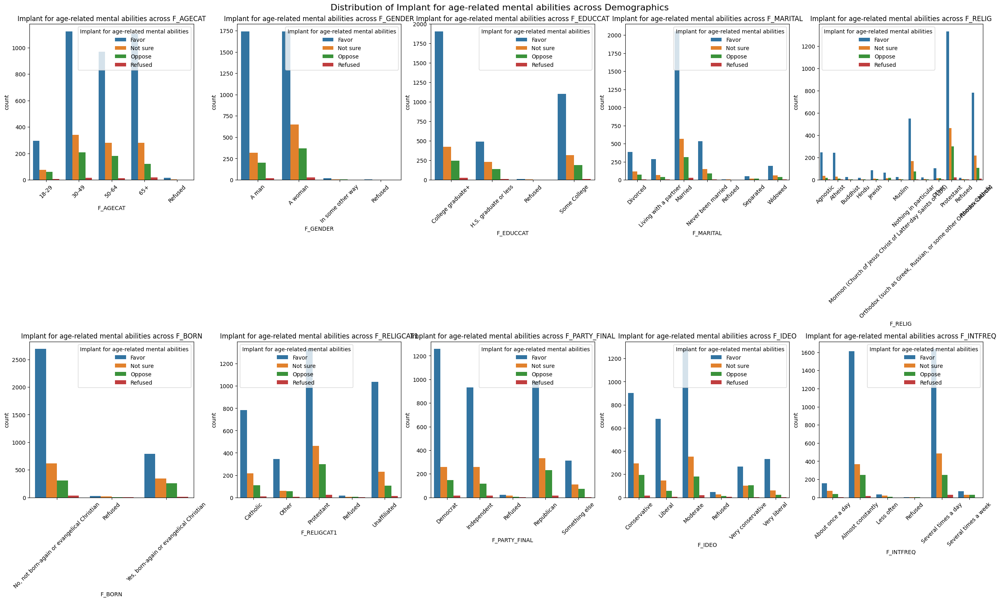


Crosstab between F_AGECAT and Implant for age-related mental abilities:

BCHIP14_a_W99  Favor  Not sure  Oppose  Refused
F_AGECAT                                       
18-29            296        75      61        6
30-49           1124       339     209       14
50-64            970       280     182       12
65+             1104       279     121       17
Refused           15         3       0        0

Crosstab between F_GENDER and Implant for age-related mental abilities:

BCHIP14_a_W99      Favor  Not sure  Oppose  Refused
F_GENDER                                           
A man               1742       319     199       19
A woman             1741       649     369       29
In some other way     20         6       3        0
Refused                6         2       2        1

Crosstab between F_EDUCCAT and Implant for age-related mental abilities:

BCHIP14_a_W99          Favor  Not sure  Oppose  Refused
F_EDUCCAT                                              
College graduate+

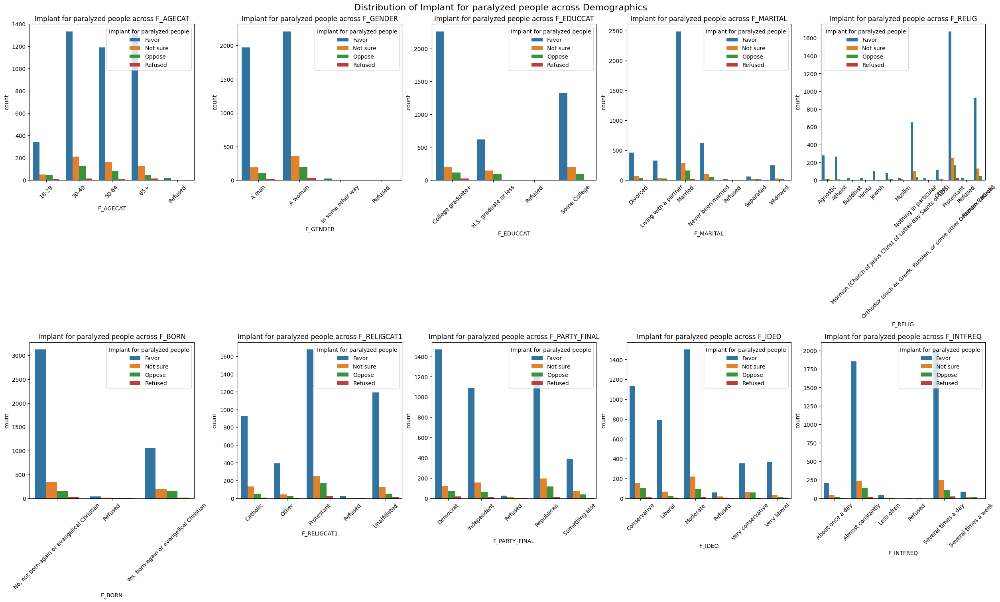


Crosstab between F_AGECAT and Implant for paralyzed people:

BCHIP14_b_W99  Favor  Not sure  Oppose  Refused
F_AGECAT                                       
18-29            339        51      42        6
30-49           1334       210     128       14
50-64           1189       165      81        9
65+             1330       127      48       16
Refused           17         1       0        0

Crosstab between F_GENDER and Implant for paralyzed people:

BCHIP14_b_W99      Favor  Not sure  Oppose  Refused
F_GENDER                                           
A man               1972       189     101       17
A woman             2209       356     196       27
In some other way     22         5       2        0
Refused                6         4       0        1

Crosstab between F_EDUCCAT and Implant for paralyzed people:

BCHIP14_b_W99          Favor  Not sure  Oppose  Refused
F_EDUCCAT                                              
College graduate+       2261       201     115       

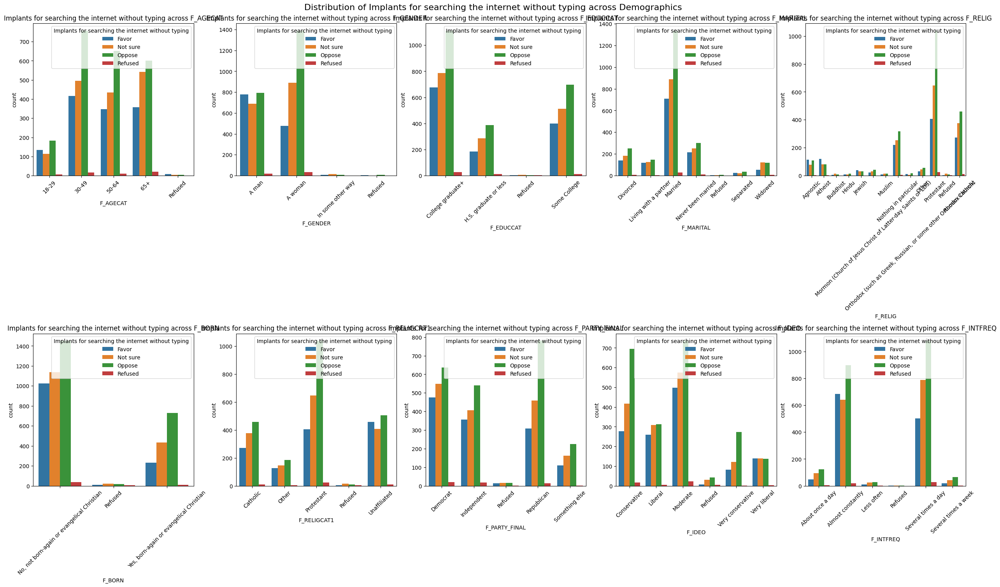


Crosstab between F_AGECAT and Implants for searching the internet without typing:

BCHIP14_c_W99  Favor  Not sure  Oppose  Refused
F_AGECAT                                       
18-29            134       114     183        7
30-49            417       495     758       16
50-64            348       434     652       10
65+              357       543     600       21
Refused            8         5       5        0

Crosstab between F_GENDER and Implants for searching the internet without typing:

BCHIP14_c_W99      Favor  Not sure  Oppose  Refused
F_GENDER                                           
A man                780       687     792       20
A woman              476       889    1390       33
In some other way      6        14       9        0
Refused                2         1       7        1

Crosstab between F_EDUCCAT and Implants for searching the internet without typing:

BCHIP14_c_W99          Favor  Not sure  Oppose  Refused
F_EDUCCAT                                  

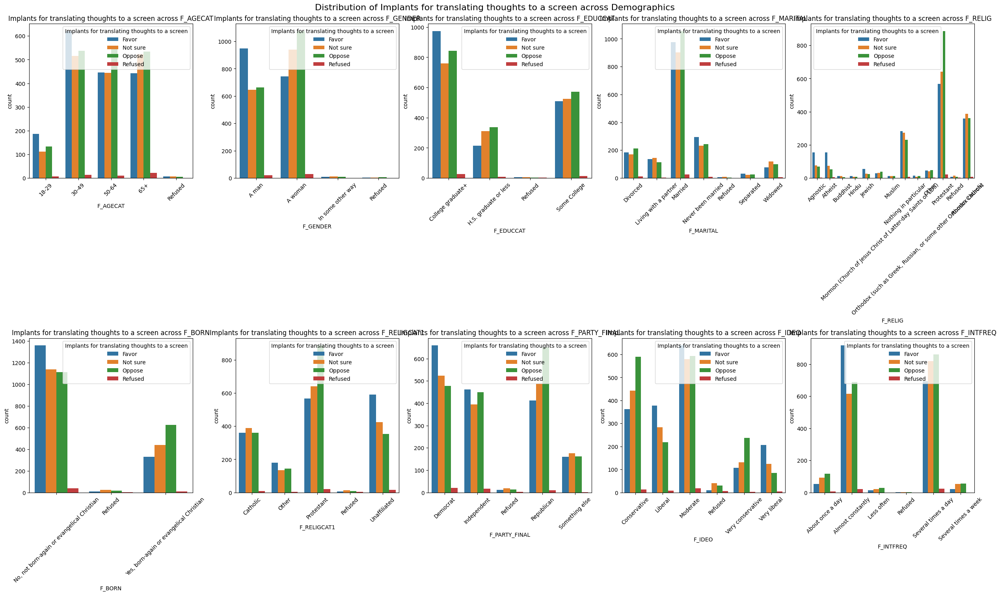


Crosstab between F_AGECAT and Implants for translating thoughts to a screen:

BCHIP14_d_W99  Favor  Not sure  Oppose  Refused
F_AGECAT                                       
18-29            186       112     133        7
30-49            621       515     537       13
50-64            446       444     544       10
65+              443       523     534       21
Refused            6         7       5        0

Crosstab between F_GENDER and Implants for translating thoughts to a screen:

BCHIP14_d_W99      Favor  Not sure  Oppose  Refused
F_GENDER                                           
A man                948       646     664       21
A woman              743       940    1076       29
In some other way      9        12       8        0
Refused                2         3       5        1

Crosstab between F_EDUCCAT and Implants for translating thoughts to a screen:

BCHIP14_d_W99          Favor  Not sure  Oppose  Refused
F_EDUCCAT                                              
Co

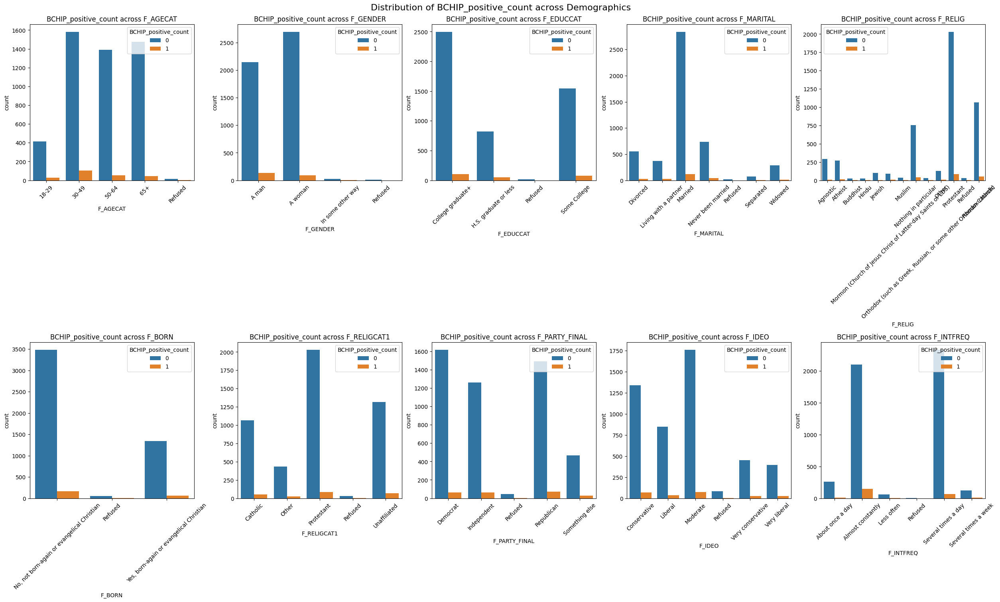


Crosstab between F_AGECAT and BCHIP_positive_count:

BCHIP_positive_count     0    1
F_AGECAT                       
18-29                  412   26
30-49                 1582  104
50-64                 1389   55
65+                   1476   45
Refused                 17    1

Crosstab between F_GENDER and BCHIP_positive_count:

BCHIP_positive_count     0    1
F_GENDER                       
A man                 2142  137
A woman               2695   93
In some other way       28    1
Refused                 11    0

Crosstab between F_EDUCCAT and BCHIP_positive_count:

BCHIP_positive_count      0    1
F_EDUCCAT                       
College graduate+      2499  104
H.S. graduate or less   819   50
Refused                  16    0
Some College           1542   77

Crosstab between F_MARITAL and BCHIP_positive_count:

BCHIP_positive_count      0    1
F_MARITAL                       
Divorced                554   24
Living with a partner   370   24
Married                2840  120
Nev

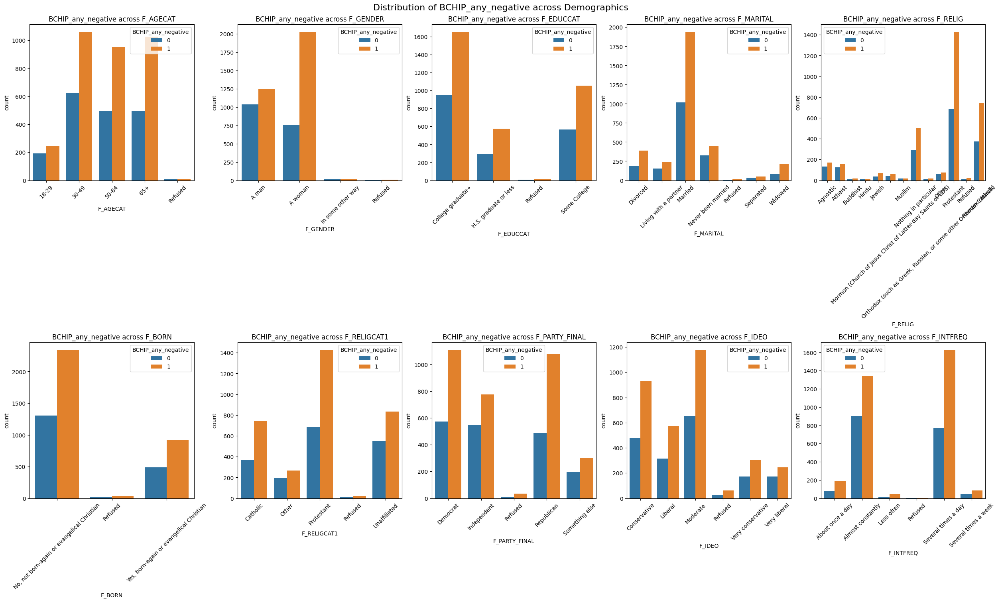


Crosstab between F_AGECAT and BCHIP_any_negative:

BCHIP_any_negative    0     1
F_AGECAT                     
18-29               192   246
30-49               625  1061
50-64               493   951
65+                 495  1026
Refused               7    11

Crosstab between F_GENDER and BCHIP_any_negative:

BCHIP_any_negative     0     1
F_GENDER                      
A man               1035  1244
A woman              760  2028
In some other way     14    15
Refused                3     8

Crosstab between F_EDUCCAT and BCHIP_any_negative:

BCHIP_any_negative       0     1
F_EDUCCAT                       
College graduate+      948  1655
H.S. graduate or less  294   575
Refused                  5    11
Some College           565  1054

Crosstab between F_MARITAL and BCHIP_any_negative:

BCHIP_any_negative        0     1
F_MARITAL                        
Divorced                192   386
Living with a partner   153   241
Married                1019  1941
Never been married      32

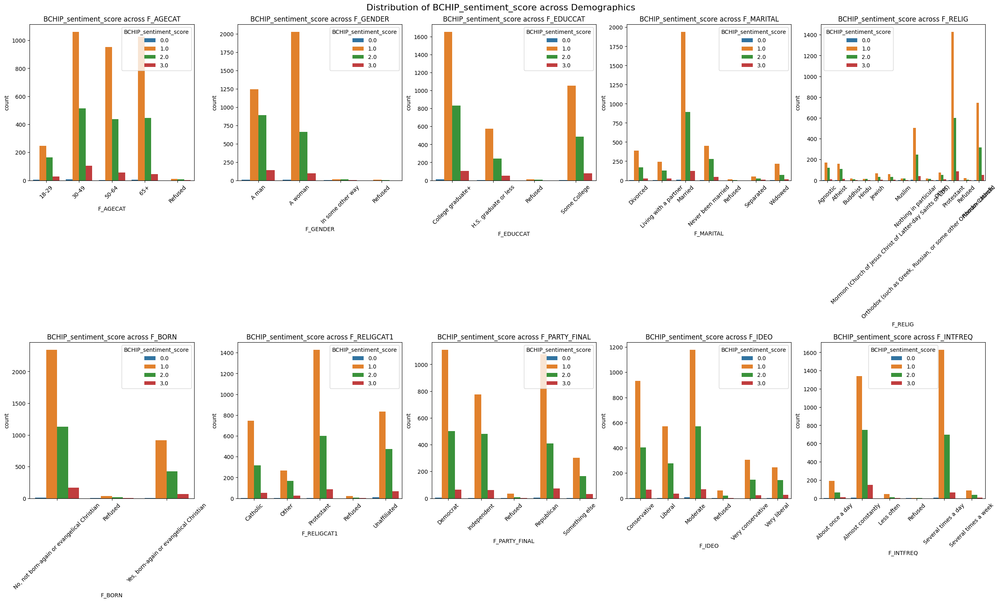


Crosstab between F_AGECAT and BCHIP_sentiment_score:

BCHIP_sentiment_score  0.0   1.0  2.0  3.0
F_AGECAT                                  
18-29                    3   246  163   26
30-49                    7  1061  514  104
50-64                    1   951  437   55
65+                      4  1026  446   45
Refused                  0    11    6    1

Crosstab between F_GENDER and BCHIP_sentiment_score:

BCHIP_sentiment_score  0.0   1.0  2.0  3.0
F_GENDER                                  
A man                    6  1244  892  137
A woman                  8  2028  659   93
In some other way        1    15   12    1
Refused                  0     8    3    0

Crosstab between F_EDUCCAT and BCHIP_sentiment_score:

BCHIP_sentiment_score  0.0   1.0  2.0  3.0
F_EDUCCAT                                 
College graduate+       10  1655  834  104
H.S. graduate or less    3   575  241   50
Refused                  0    11    5    0
Some College             2  1054  486   77

Crosstab between

In [245]:
# Define the BCHIP columns and demographic columns
bchip_columns = [col for col in df.columns if 'BCHIP' in col]
demographic_columns = [
    'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_MARITAL', 'F_RELIG', 
    'F_BORN', 'F_RELIGCAT1', 'F_PARTY_FINAL', 'F_IDEO', 'F_INTFREQ'
]

# Handle missing values using the most frequent strategy for simplicity
imputer = SimpleImputer(strategy='most_frequent')
df[bchip_columns + demographic_columns] = imputer.fit_transform(df[bchip_columns + demographic_columns])

# Convert categorical columns to appropriate data type
for col in demographic_columns + bchip_columns:
    df[col] = df[col].astype('category')

# Add a description to the column names in bchip_data using a dictionary
column_description = {
    'BCHIP1_W99': 'Heard about Computer Implants in Brain',
    'BCHIP2_W99': 'Is it a good idea for Society',
    'BCHIP3_W99': 'Do you want a computer Chip',
    'BCHIP4_a_W99': 'Will it be more productive in a job',
    'BCHIP4_b_W99': 'Will we use it before we understand health implication',
    'BCHIP4_c_W99': 'Will it lead to new problem Solving Ability',
    'BCHIP4_d_W99': 'Eliminate Natural Differences between people',
    'BCHIP5_W99': 'How do you feel about wide Spread brain implants',
    'BCHIP6_W99': 'Would this cause pressure to get implant',
    'BCHIP7_W99': 'Would this help judgment',
    'BCHIP8_W99': 'Do you think computer Chip would effect income gap',
    'BCHIP9_a_W99': 'Would implant Malfunction',
    'BCHIP9_b_W99': 'Would Implant be hacked',
    'BCHIP9_c_W99': 'Will implant affect brain function',
    'BCHIP10_a_W99': 'How much of a role for Federal Government',
    'BCHIP10_b_W99': 'How much of a role does implant companies have',
    'BCHIP10_c_W99': 'How much of a role people with chips have',
    'BCHIP10_d_W99': 'How much of a role does medical implant doctors',
    'BCHIP11_W99': 'If widespread, what is your greater concern with Government',
    'BCHIP12_W99': 'View on Safety and effectiveness of Brain Implants',
    'BCHIP13_a_W99': 'Would it be effective if Brain Implants could be turned off and on',
    'BCHIP13_b_W99': 'Would implant be in place without surgery',
    'BCHIP14_a_W99': 'Implant for age-related mental abilities',
    'BCHIP14_b_W99': 'Implant for paralyzed people',
    'BCHIP14_c_W99': 'Implants for searching the internet without typing',
    'BCHIP14_d_W99': 'Implants for translating thoughts to a screen'
}

# Visualize the relationship between BCHIP responses and demographic features
def plot_bchip_demographics_combined(bchip_col):
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15), constrained_layout=True)
    axes = axes.flatten()
    for i, demo_col in enumerate(demographic_columns):
        sns.countplot(x=demo_col, hue=bchip_col, data=df, ax=axes[i])
        axes[i].set_title(f'{column_description.get(bchip_col, bchip_col)} across {demo_col}')
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].legend(title=column_description.get(bchip_col, bchip_col))
    plt.suptitle(f'Distribution of {column_description.get(bchip_col, bchip_col)} across Demographics', fontsize=16)
    plt.show()

    # Print crosstab result
    for demo_col in demographic_columns:
        crosstab_result = pd.crosstab(df[demo_col], df[bchip_col])
        print(f"\nCrosstab between {demo_col} and {column_description.get(bchip_col, bchip_col)}:\n")
        print(crosstab_result)

# Example: Plotting the relationship between each BCHIP column and each demographic column
for bchip_col in bchip_columns:
    plot_bchip_demographics_combined(bchip_col)

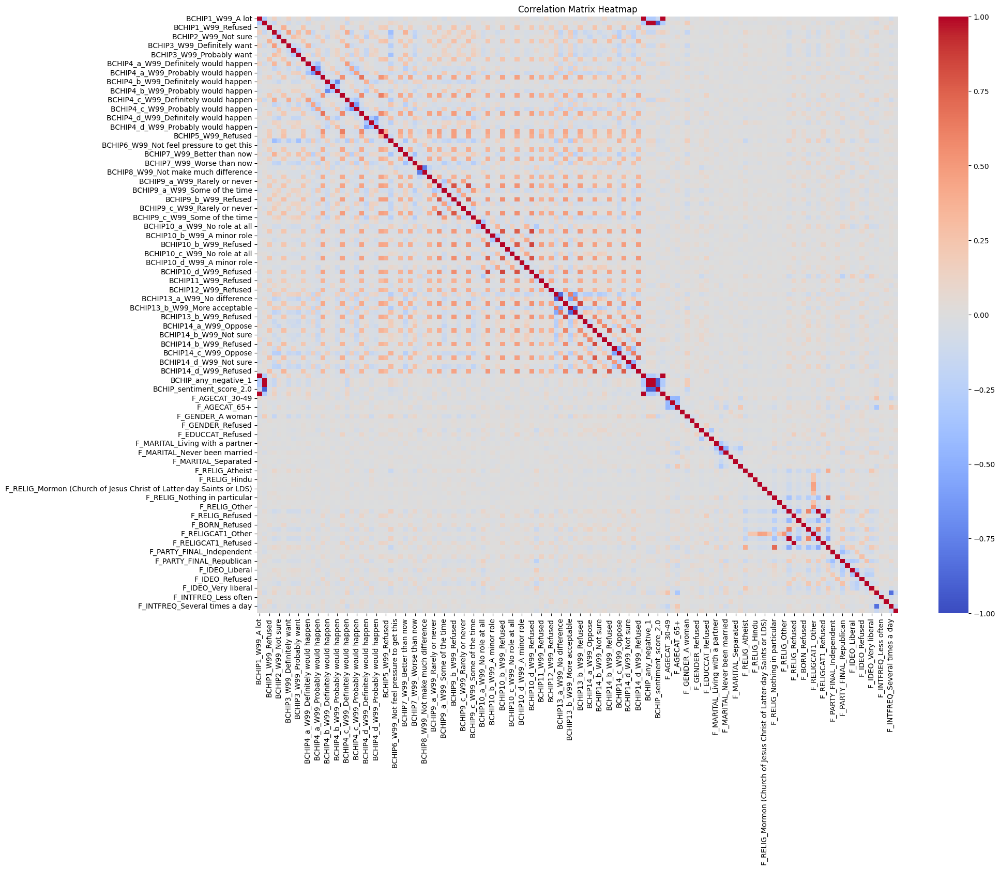

In [246]:
# Define the BCHIP columns and demographic columns
bchip_columns = [col for col in df.columns if 'BCHIP' in col]
demographic_columns = [
    'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_MARITAL', 'F_RELIG', 
    'F_BORN', 'F_RELIGCAT1', 'F_PARTY_FINAL', 'F_IDEO', 'F_INTFREQ'
]

# Handle missing values using the most frequent strategy for simplicity
imputer = SimpleImputer(strategy='most_frequent')
df[bchip_columns + demographic_columns] = imputer.fit_transform(df[bchip_columns + demographic_columns])

# Convert categorical columns to appropriate data type
for col in demographic_columns + bchip_columns:
    df[col] = df[col].astype('category')

# Convert categorical variables to numerical using one-hot encoding
df_encoded = pd.get_dummies(df[bchip_columns + demographic_columns], drop_first=True)

# Compute the correlation matrix
corr_matrix = df_encoded.corr()

# Plot the correlation matrix
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()


Model Evaluation Results (Cross-Validation):
           Logistic Regression  Random Forest
accuracy              0.729195       0.729978
precision             0.683784       0.666352
recall                0.729195       0.729978
f1                    0.696357       0.666968
The best model is: Logistic Regression


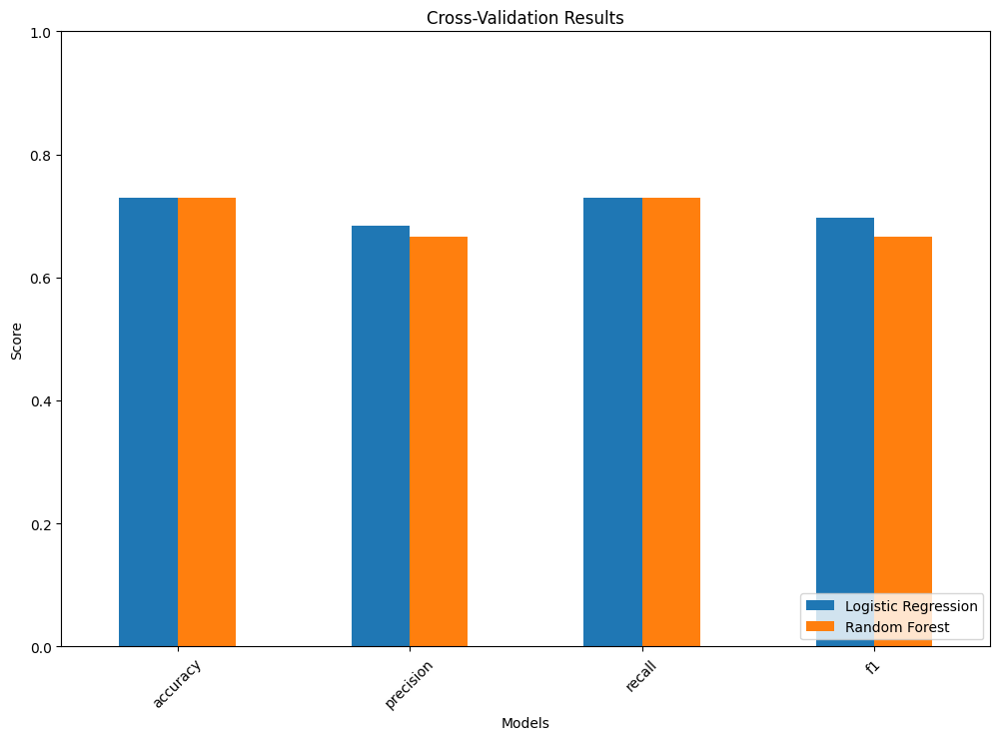


Train Set Evaluation Metrics:
Accuracy: 0.7554
Precision: 0.7281
Recall: 0.7554
F1 Score: 0.7269

Test Set Evaluation Metrics:
Accuracy: 0.7299
Precision: 0.6900
Recall: 0.7299
F1 Score: 0.6985


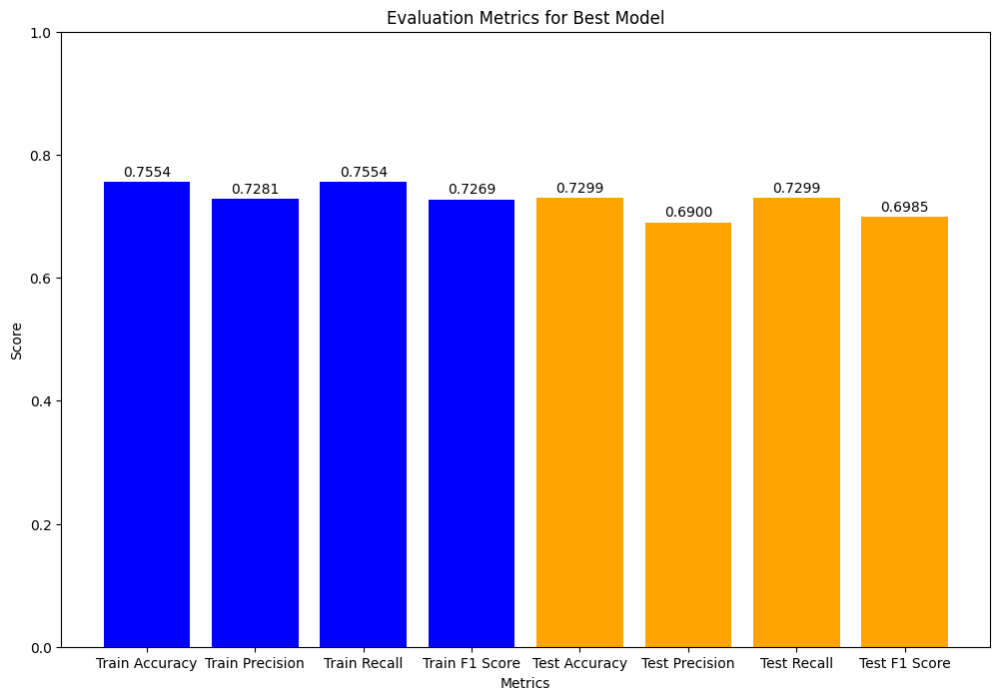


Classification Report (Test Set):
                                     precision    recall  f1-score   support

                    Mostly positive       0.47      0.32      0.38       235
Equal positive and negative effects       0.42      0.10      0.16        52
                    Mostly negative       0.78      0.91      0.84       731
                            Refused       0.00      0.00      0.00         4

                           accuracy                           0.73      1022
                          macro avg       0.42      0.33      0.35      1022
                       weighted avg       0.69      0.73      0.70      1022



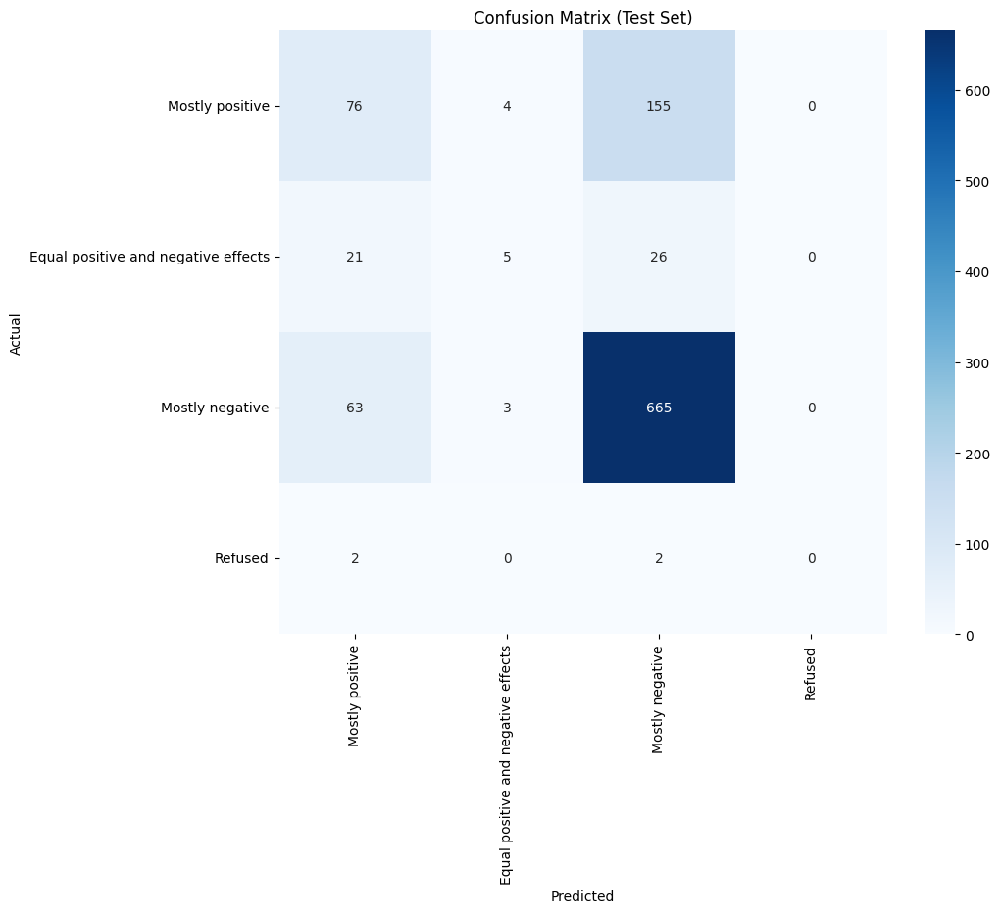

In [247]:
# Define the BCHIP columns and demographic columns
bchip_columns = [col for col in df.columns if 'BCHIP' in col]
demographic_columns = [
    'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_MARITAL', 'F_RELIG', 
    'F_BORN', 'F_RELIGCAT1', 'F_PARTY_FINAL', 'F_IDEO', 'F_INTFREQ'
]

# Define the target column
target_column = 'SC1_W99'

# Handle missing values using the most frequent strategy for simplicity
imputer = SimpleImputer(strategy='most_frequent')
df[bchip_columns + demographic_columns + [target_column]] = imputer.fit_transform(df[bchip_columns + demographic_columns + [target_column]])

# Convert categorical columns to appropriate data type
for col in demographic_columns + bchip_columns + [target_column]:
    df[col] = df[col].astype('category')

# Encode the target column
label_encoder = LabelEncoder()
df[target_column] = label_encoder.fit_transform(df[target_column])

# Split the data into features (X) and target (y)
X = df[bchip_columns + demographic_columns]
y = df[target_column]

# Preprocess the features
categorical_cols = X.select_dtypes(include=['category']).columns.tolist()
numeric_cols = X.select_dtypes(include=['number']).columns.tolist()

numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(drop='first'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Define the models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
}

# Define evaluation metrics for cross-validation
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='weighted', zero_division=0),
    'recall': make_scorer(recall_score, average='weighted', zero_division=0),
    'f1': make_scorer(f1_score, average='weighted', zero_division=0)
}

# Perform cross-validation and evaluate models
results = {}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', model)])
    
    scores = cross_validate(pipeline, X, y, cv=cv, scoring=scoring, return_train_score=False)
    results[name] = {metric: scores[f'test_{metric}'] for metric in scoring.keys()}

# Train the best model
best_model = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', models[best_model_name])])
best_model.fit(X, y)

# Display the cross-validation results
results_df = pd.DataFrame({model: {metric: results[model][metric].mean() for metric in scoring.keys()} for model in results})
print("\nModel Evaluation Results (Cross-Validation):")
print(results_df)

# Select the best model based on mean F1 Score for classification
best_model_name = max(results, key=lambda name: results[name]['f1'].mean())
print(f"The best model is: {best_model_name}")


# Plot the cross-validation results
results_df.plot(kind='bar', figsize=(12, 8))
plt.title('Cross-Validation Results')
plt.xlabel('Models')
plt.ylabel('Score')
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.legend(loc='lower right')
plt.show()


# Predict on the train set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
best_model.fit(X_train, y_train)
y_train_pred = best_model.predict(X_train)

# Predict on the test set
y_test_pred = best_model.predict(X_test)

# Evaluate the model on the train set
train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)

print("\nTrain Set Evaluation Metrics:")
print(f"Accuracy: {train_accuracy:.4f}")
print(f"Precision: {train_precision:.4f}")
print(f"Recall: {train_recall:.4f}")
print(f"F1 Score: {train_f1:.4f}")

# Evaluate the model on the test set
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

print("\nTest Set Evaluation Metrics:")
print(f"Accuracy: {test_accuracy:.4f}")
print(f"Precision: {test_precision:.4f}")
print(f"Recall: {test_recall:.4f}")
print(f"F1 Score: {test_f1:.4f}")

# Plot the evaluation metrics
metrics = {
    'Train Accuracy': train_accuracy,
    'Train Precision': train_precision,
    'Train Recall': train_recall,
    'Train F1 Score': train_f1,
    'Test Accuracy': test_accuracy,
    'Test Precision': test_precision,
    'Test Recall': test_recall,
    'Test F1 Score': test_f1
}

plt.figure(figsize=(12, 8))
plt.bar(metrics.keys(), metrics.values(), color=['blue', 'blue', 'blue', 'blue', 'orange', 'orange', 'orange', 'orange'])
plt.xlabel('Metrics')
plt.ylabel('Score')
plt.title('Evaluation Metrics for Best Model')
plt.ylim(0, 1)
for i, value in enumerate(metrics.values()):
    plt.text(i, value + 0.01, f"{value:.4f}", ha='center')
plt.show()

print("\nClassification Report (Test Set):")
target_names = label_encoder.inverse_transform([0, 1, 2, 3])
target_names = ['Mostly positive', 'Equal positive and negative effects', 'Mostly negative', 'Refused']
print(classification_report(y_test, y_test_pred, target_names=target_names, zero_division=0))

# Confusion matrix for the test set
conf_matrix = confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Test Set)')
plt.show()

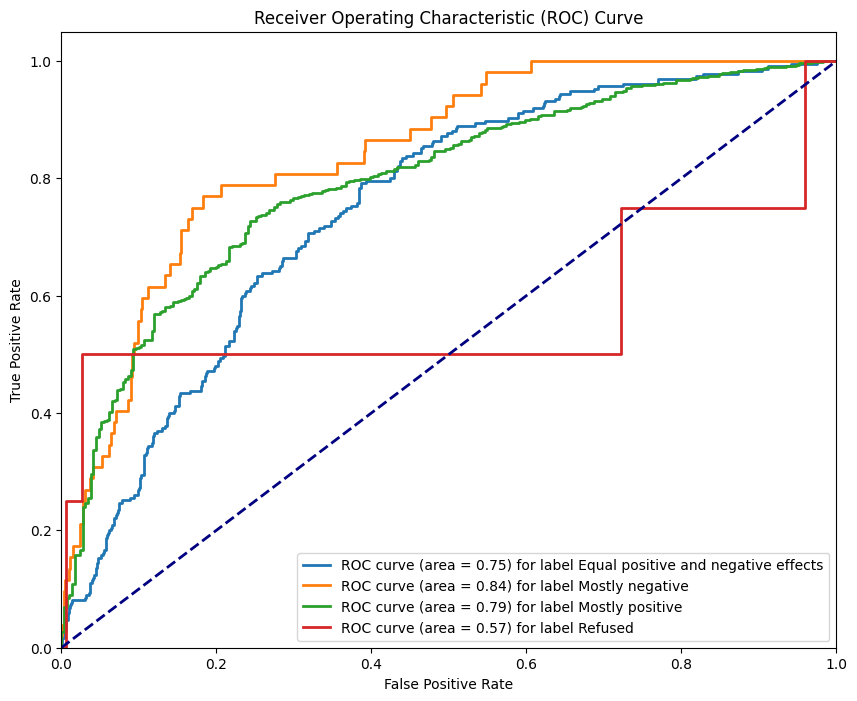

In [248]:
# ROC Curve
plt.figure(figsize=(10, 8))
y_test_prob = best_model.predict_proba(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(label_encoder.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_test_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (area = {roc_auc[i]:0.2f}) for label {label_encoder.classes_[i]}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

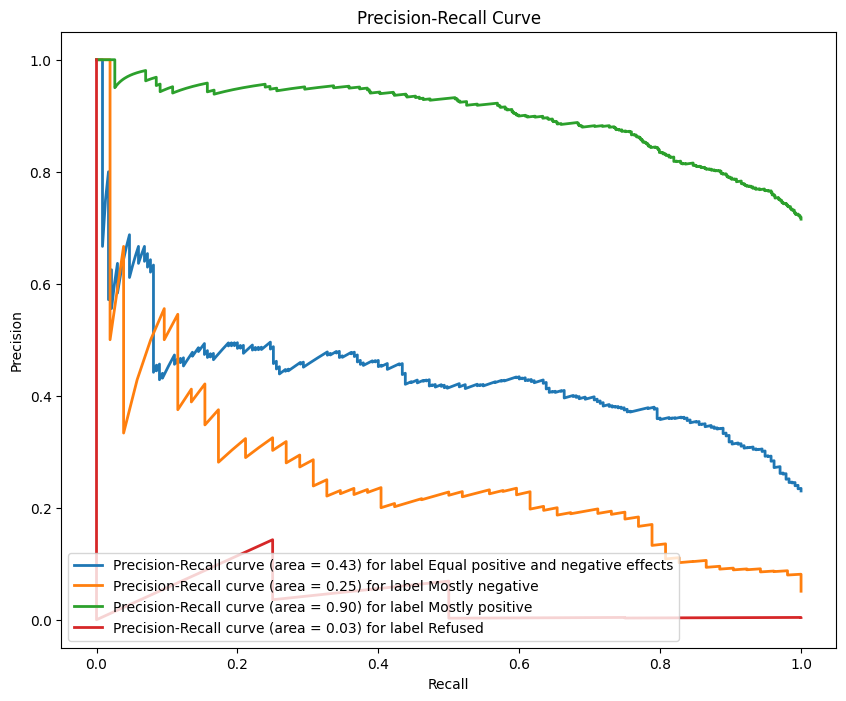

In [249]:
# Create and train the logistic regression model
logistic_model = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', LogisticRegression(max_iter=1000, random_state=42))])
logistic_model.fit(X_train, y_train)

# Predict probabilities for the test set
y_test_prob = logistic_model.predict_proba(X_test)

# Precision-Recall Curve
plt.figure(figsize=(10, 8))
precision = dict()
recall = dict()
average_precision = dict()
for i in range(len(label_encoder.classes_)):
    precision[i], recall[i], _ = precision_recall_curve(y_test == i, y_test_prob[:, i])
    average_precision[i] = auc(recall[i], precision[i])
    plt.plot(recall[i], precision[i], lw=2, label=f'Precision-Recall curve (area = {average_precision[i]:0.2f}) for label {label_encoder.classes_[i]}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.show()

In [250]:
# Create and train the logistic regression model
logistic_model = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', LogisticRegression(max_iter=1000, random_state=42))])
logistic_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  []),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(drop='first'))]),
                                                  ['BCHIP1_W99', 'BCHIP2_W99',
                                                   'BCHIP3_W99', 'BCHIP4_a_W99',
                                                   'BCHIP4_b_W99',
                                                   'BCHIP4_c_W99',
                                                   'BCHIP4_d_W99', 'BCHIP5_W99',
                                                   'BCHIP6_W99', 'BCHIP7_W99',
                                                   'BCHIP8_W99', 'BCHIP9_a_W99...
                                                   'BCHIP9_c_W99',
                                                   'BCHIP10_a_W99',
                                                   'BCHIP10_b_W99',
                                                   'BCHIP10_c_W99',
                                                   'BCHIP10_d_W99',
                                                   'BCHIP11_W99', 'BCHIP12_W99',
                                                   'BCHIP13_a_W99',
                                                   'BCHIP13_b_W99',
                                                   'BCHIP14_a_W99',
                                                   'BCHIP14_b_W99',
                                                   'BCHIP14_c_W99',
                                                   'BCHIP14_d_W99',
                                                   'BCHIP_positive_count',
                                                   'BCHIP_any_negative',
                                                   'BCHIP_sentiment_score',
                                                   'F_AGECAT', ...])])),
                ('classifier',
                 LogisticRegression(max_iter=1000, random_state=42))])

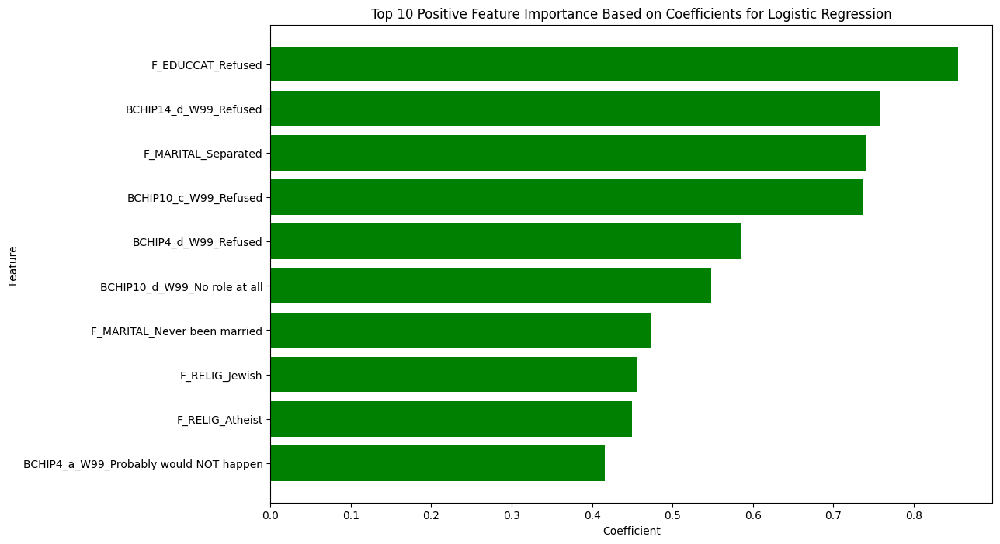


Top 10 Positive Features by Absolute Coefficient Value:
                                    Feature  Coefficient  Absolute Coefficient
92                        F_EDUCCAT_Refused     0.855010              0.855010
78                    BCHIP14_d_W99_Refused     0.758505              0.758505
98                      F_MARITAL_Separated     0.740970              0.740970
53                    BCHIP10_c_W99_Refused     0.737145              0.737145
25                     BCHIP4_d_W99_Refused     0.585534              0.585534
55             BCHIP10_d_W99_No role at all     0.548134              0.548134
96             F_MARITAL_Never been married     0.473219              0.473219
103                          F_RELIG_Jewish     0.456170              0.456170
100                         F_RELIG_Atheist     0.449292              0.449292
11   BCHIP4_a_W99_Probably would NOT happen     0.415370              0.415370


In [251]:


# Extract the feature names after preprocessing
preprocessor.fit(X_train)
feature_names = numeric_cols + list(preprocessor.transformers_[1][1]['onehot'].get_feature_names_out(categorical_cols))

# Extract the coefficients and their corresponding feature names
coefficients = logistic_model.named_steps['classifier'].coef_[0]

# Create a DataFrame to display feature importance
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Sort the features by their absolute coefficient values
feature_importance_df['Absolute Coefficient'] = feature_importance_df['Coefficient'].abs()
feature_importance_df = feature_importance_df.sort_values(by='Absolute Coefficient', ascending=False)

# Plot the top 10 positive feature importances
top_positive_features = feature_importance_df[feature_importance_df['Coefficient'] > 0].head(10)
plt.figure(figsize=(12, 8))
plt.barh(top_positive_features['Feature'], top_positive_features['Coefficient'], color='green')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Top 10 Positive Feature Importance Based on Coefficients for Logistic Regression')
plt.gca().invert_yaxis()
plt.show()

# Display the top positive features
print("\nTop 10 Positive Features by Absolute Coefficient Value:")
print(top_positive_features)